In [116]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import pandas as pd

### Czarne punkty na mapie to stacje z których są pobierane informacje

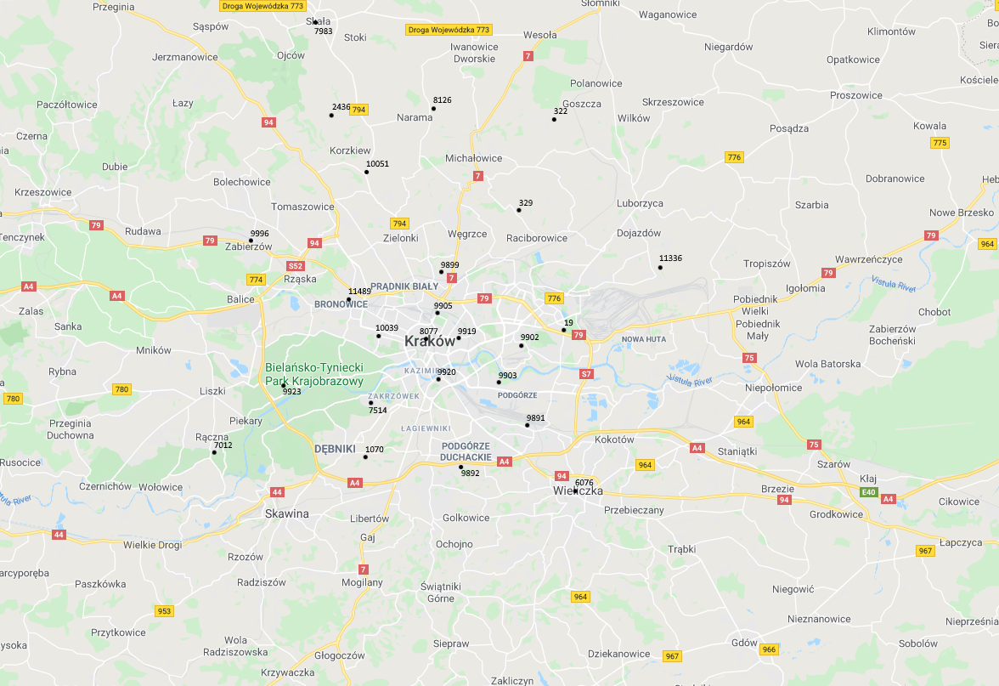

In [117]:
from IPython.display import Image
Image(filename='mapa_google.png') 
# TODO: oznaczyc kazda ze stacji jednym kolorem by byly zawsze takie same na wykresach

## Wczytanie danych z pliku csv

In [118]:
df = pd.read_csv('./measurements.csv', header = 0).iloc[:, 1:]
df = df.drop(columns=['indexLevel'])

## Wczytanie danych z prosto z bazy danych

In [119]:
import sqlalchemy
import pyodbc

fo = open('password.conf', 'r+')
password = fo.readline()
connection_string = 'Driver={ODBC Driver 13 for SQL Server};Server=tcp:airly-db-server.database.windows.net,1433;Database=AirlyDatabase;Uid=admin1;Pwd=%s;Encrypt=yes;TrustServerCertificate=no;Connection Timeout=30;' % (password)

cnxn = pyodbc.connect(connection_string)
df = pd.read_sql_query('select * from measurement', cnxn).iloc[:, 1:]

In [120]:
df['fromDataTime'] = df['fromDataTime'].apply(lambda x: pd.to_datetime(x))
df['tillDateTime'] = df['tillDateTime'].apply(lambda x: pd.to_datetime(x))

dayOfWeekMap = {'Monday': 1, 'Tuesday': 2, 'Wednesday': 3, 'Thursday': 4, 'Friday': 5, 'Saturday': 6, 'Sunday': 7}
df['dayOfWeek'] = df['dayOfWeek'].apply(lambda x: dayOfWeekMap[x])
df['coronavirus'] = df['coronavirus'].apply(lambda x: 1 if x else 0)
df['typeOfDay'] = df['typeOfDay'].apply(lambda x: 1 if x == 'Weekend' else 0)

df

,installationId,fromDataTime,tillDateTime,PM1,PM25,PM10,PRESSURE,HUMIDITY,TEMPERATURE,indexValue,indexLevel,NO2,CO,CLOUDCOVER,WINDDIRECTION,WINDSPEED,dayOfWeek,coronavirus,typeOfDay
0,19,2020-03-06 15:00:00,2020-03-06 16:00:00,NaN,9.18,31.15,NaN,76.36,3.888889,31.15,LOW,65.31,440.75,59.7,110.54,10.30,5,0,0
1,19,2020-03-06 16:00:00,2020-03-06 17:00:00,NaN,11.90,35.42,NaN,76.36,3.888889,35.42,LOW,68.93,464.01,59.7,110.54,10.30,5,0,0
2,19,2020-03-06 17:00:00,2020-03-06 18:00:00,NaN,14.68,38.20,NaN,76.36,3.888889,38.20,LOW,70.74,528.15,59.7,110.54,10.30,5,0,0
3,19,2020-03-06 18:00:00,2020-03-06 19:00:00,NaN,13.06,32.74,NaN,76.36,3.888889,32.74,LOW,61.21,478.53,59.7,110.54,10.30,5,0,0
4,19,2020-03-06 19:00:00,2020-03-06 20:00:00,NaN,11.14,24.30,NaN,76.36,3.888889,24.30,VERY_LOW,34.67,392.50,59.7,110.54,10.30,5,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20124,9996,2020-04-19 23:00:00,2020-04-20 00:00:00,NaN,NaN,29.18,1022.00,59.00,2.990000,29.18,LOW,NaN,NaN,2.0,210.00,1.00,1,1,0
20125,10039,2020-04-19 23:00:00,2020-04-20 00:00:00,8.79,13.13,24.08,1023.45,49.76,0.850000,24.08,VERY_LOW,NaN,NaN,3.0,210.00,1.00,1,1,0
20126,10051,2020-04-19 23:00:00,2020-04-20 00:00:00,11.02,16.82,19.84,1021.72,68.00,1.060000,28.04,LOW,NaN,NaN,2.0,210.00,1.00,1,1,0
20127,11336,2020-04-19 23:00:00,2020-04-20 00:00:00,9.98,16.67,30.98,1021.94,66.11,2.700000,30.98,LOW,NaN,NaN,5.0,246.00,0.89,1,1,0


In [121]:
installationd_id = df['installationId'].unique()
installationd_id.sort()
measurements_by_installation_id = dict()
for id in installationd_id:
    measurements_by_installation_id[id] = df.loc[df['installationId'] == id]

In [122]:
installations = pd.read_sql_query('select * from installation', cnxn).iloc[:, :]
installations

,id,latitude,longitude,country,city,street,buildingNumber,elevation,airly,region
0,19,50.069308,20.053492,Poland,Kraków,Bulwarowa,30,203.87,False,E
1,313,50.230202,19.852896,Poland,Skala,Rynek,29,416.64,False,N
2,329,50.131500,20.014326,Poland,Ksiazniczki,None,None,227.36,True,N
3,332,50.175018,20.039064,Poland,Zagórzyce Dworskie,None,None,315.70,True,N
4,1070,50.002872,19.891985,Poland,Kraków,Profesora Geremka,26,245.78,True,S
5,6076,49.985546,20.059961,Poland,Wieliczka,Stanislawa Moniuszki,1,240.53,True,E
6,7012,50.006187,19.769005,Poland,Raczna,None,None,223.38,True,W
7,7514,50.033099,19.895774,Poland,Kraków,Skalica,21B,212.05,True,S
8,8077,50.062006,19.940984,Poland,Kraków,Mikolajska,4,220.38,True,W
9,8126,50.185143,19.947767,Poland,Kozierów,None,None,359.71,True,N


## Nazwy stacji

In [123]:
installations_labels = dict()
for _, installation in installations.iterrows():
    installation_name = '%s - %s' % (installation['city'], installation['street'])
    installations_labels[installation['id']] = installation_name

## Wyliczenie okresów kiedy były weekendy

In [124]:
def getWeekends(days):
    # [(b1, e1), (b2, e2), ...]
    weekends = list()
    isWeekend = False
    for _, d in days.iterrows():
        if d['typeOfDay'] == 1 and not isWeekend:
            isWeekend = True
            beg = d['fromDataTime']
        elif d['typeOfDay'] == 0 and isWeekend:
            isWeekend = False
            weekends.append((beg, d['fromDataTime']))
    if isWeekend:
        weekends.append((beg, days['fromDataTime'].iloc[-1]))
    return weekends

## Wykresy wszystykich stacji

In [125]:
import matplotlib.dates as mdates

def plotAllData(column: str):
    days = mdates.DayLocator()
    days_fmt = mdates.DateFormatter('%m-%d')

    fig, ax = plt.subplots()

    fig.set_figheight(15)
    fig.set_figwidth(15)
    for id, measurements in measurements_by_installation_id.items():
        ax.plot(measurements.fromDataTime, measurements[column], label=installations_labels[id])

    ax.xaxis.set_major_locator(days)
    ax.xaxis.set_major_formatter(days_fmt)
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=7))
    for weekend in getWeekends(measurements[['fromDataTime', 'typeOfDay']]):
        plt.axvspan(weekend[0], weekend[1], color='red', alpha=0.5)
    ax.grid(True)

    plt.xlabel('Dzień')
    plt.ylabel(column)
    plt.title(column)
    plt.legend()

    plt.show()

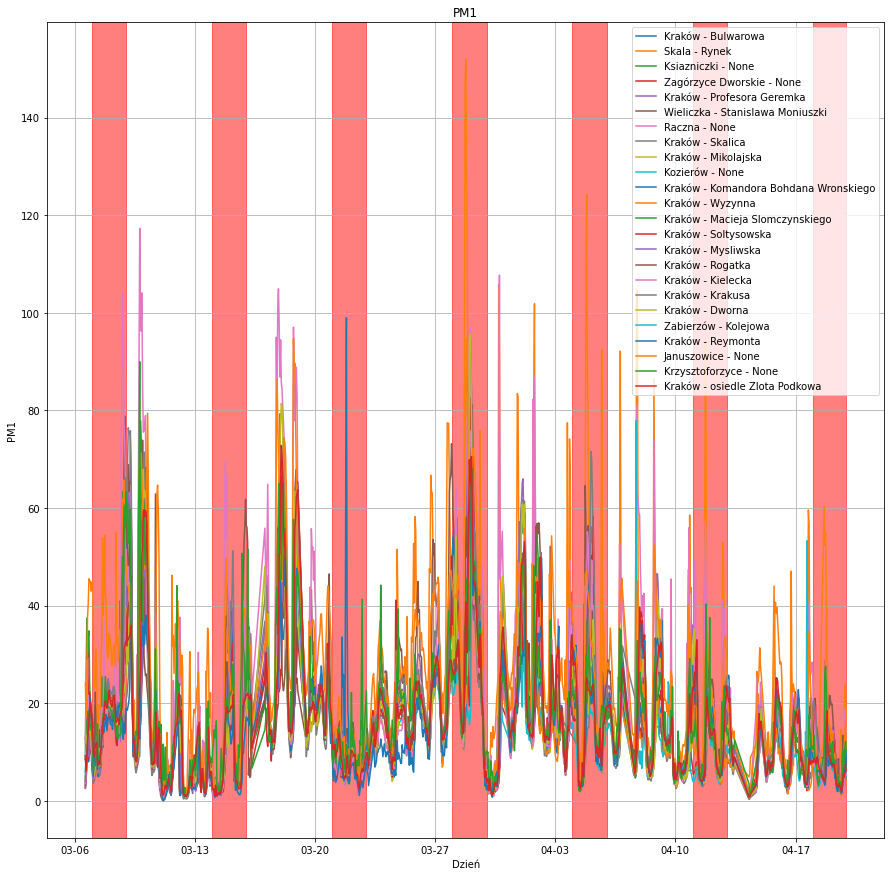

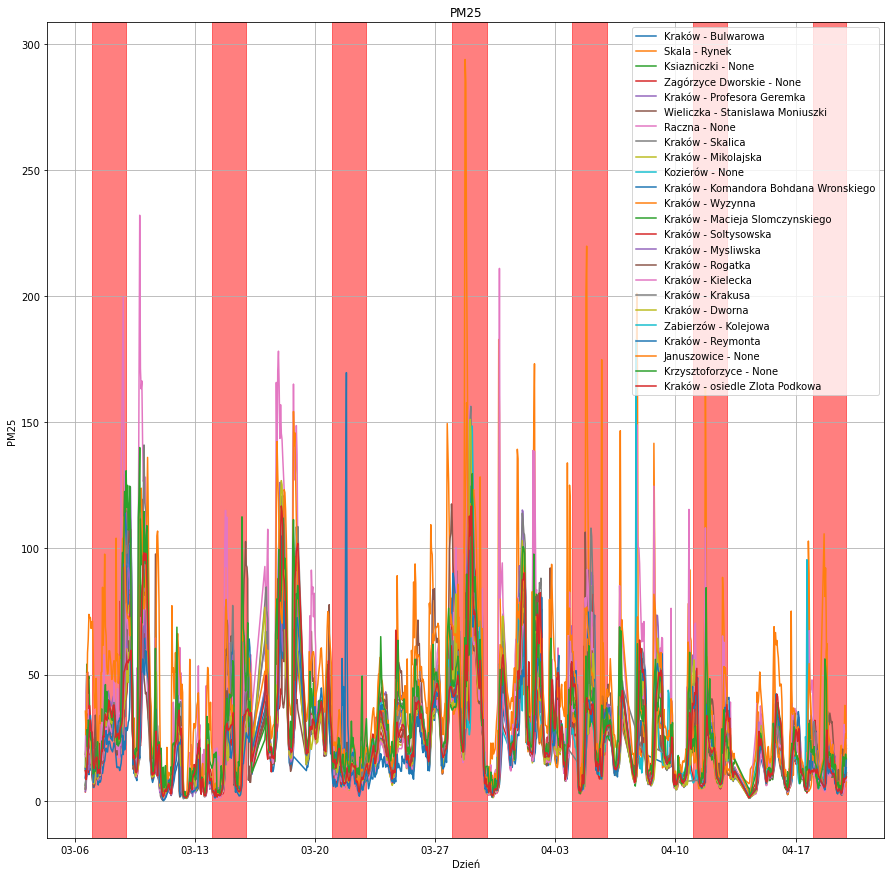

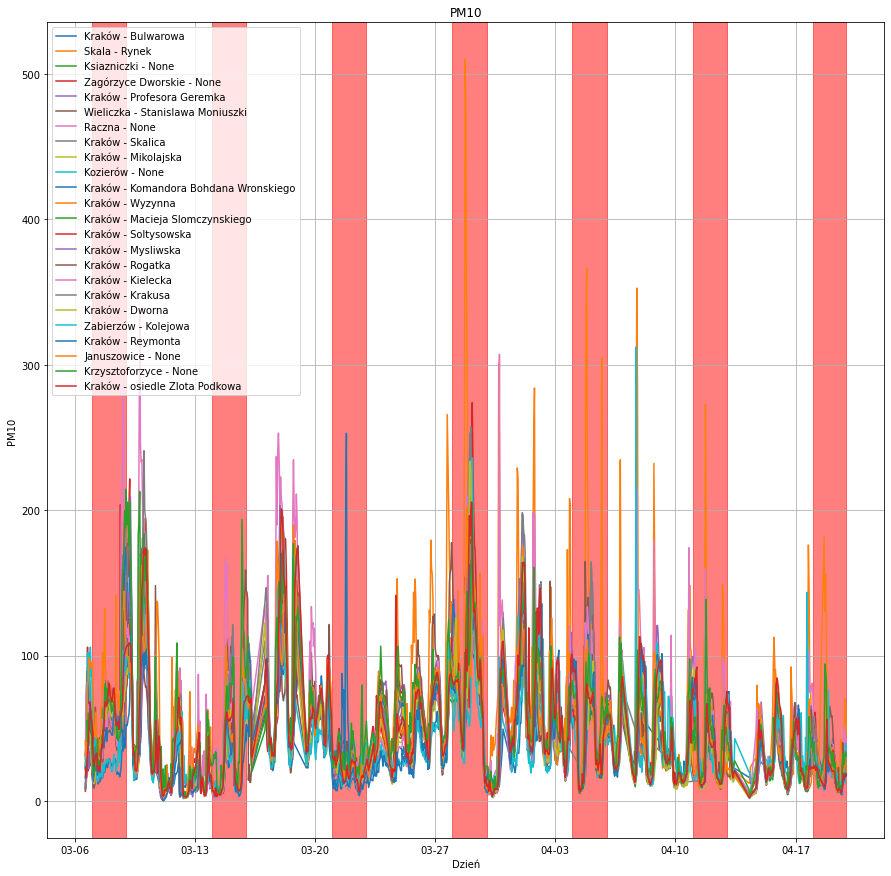

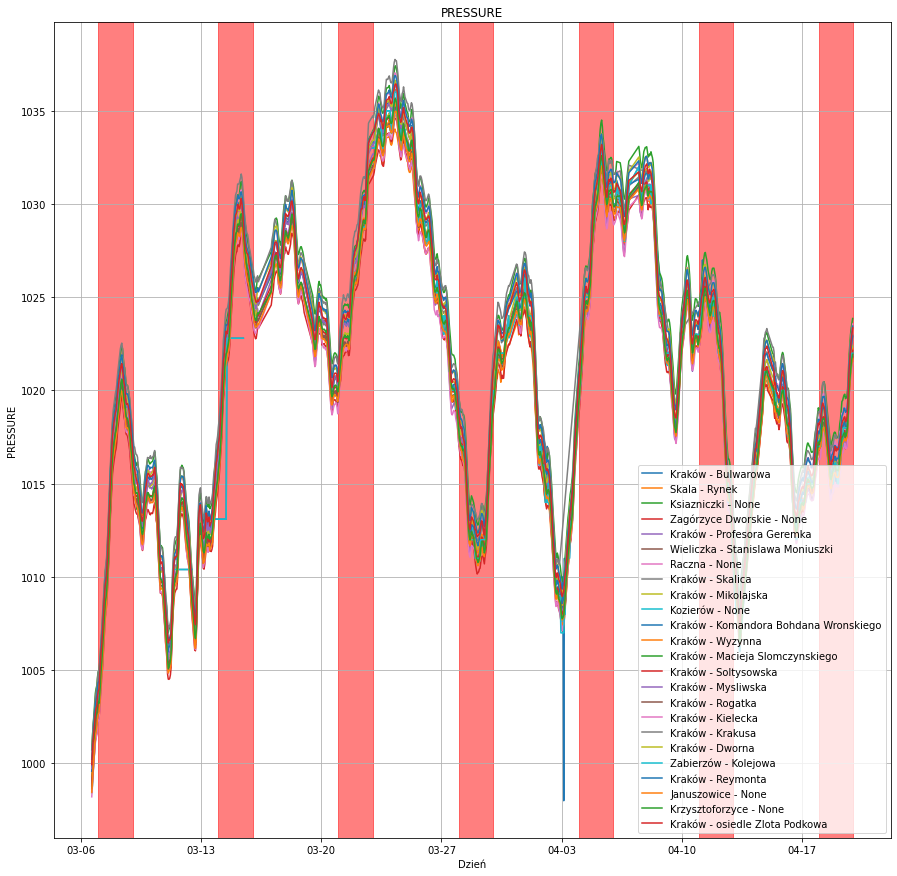

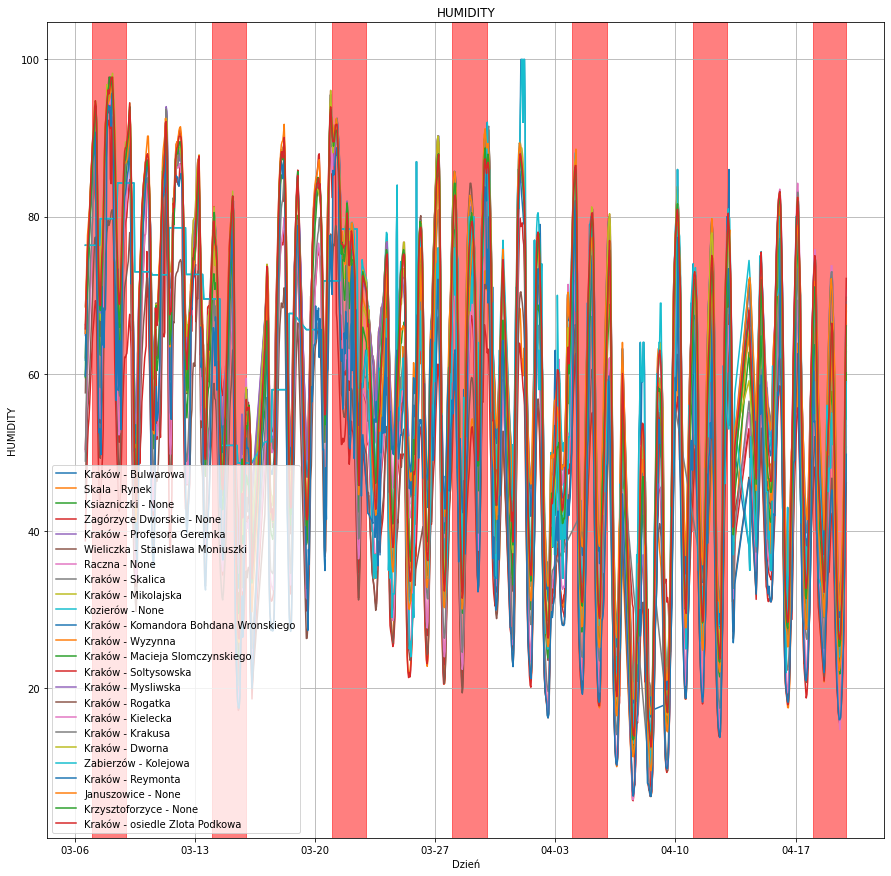

...

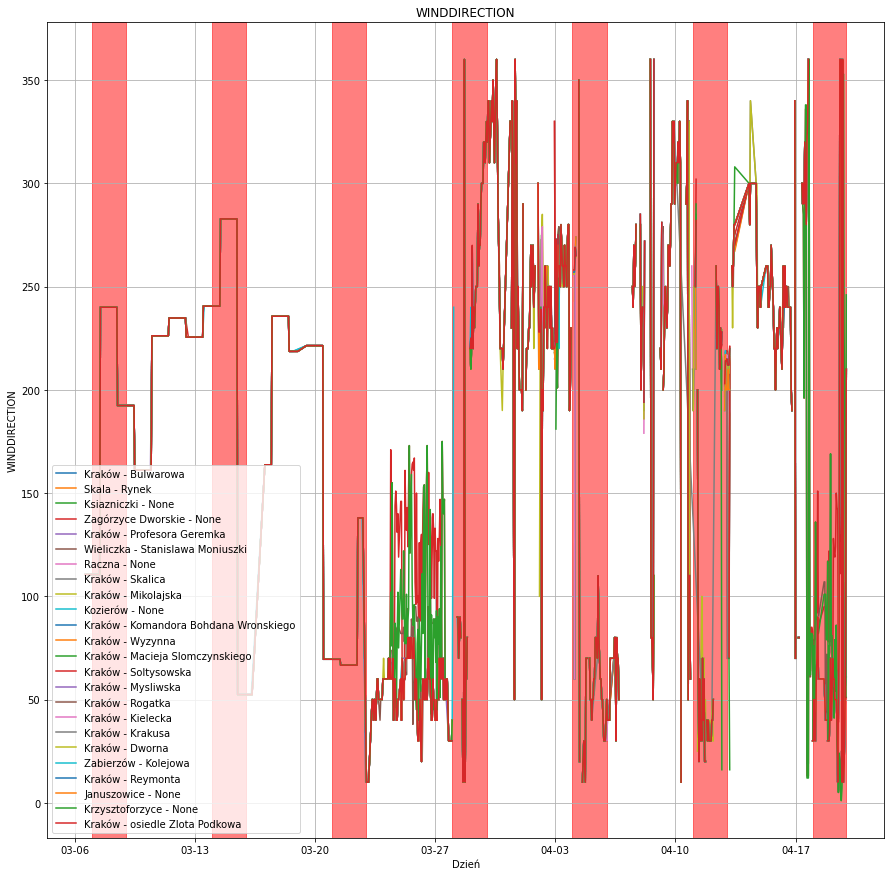

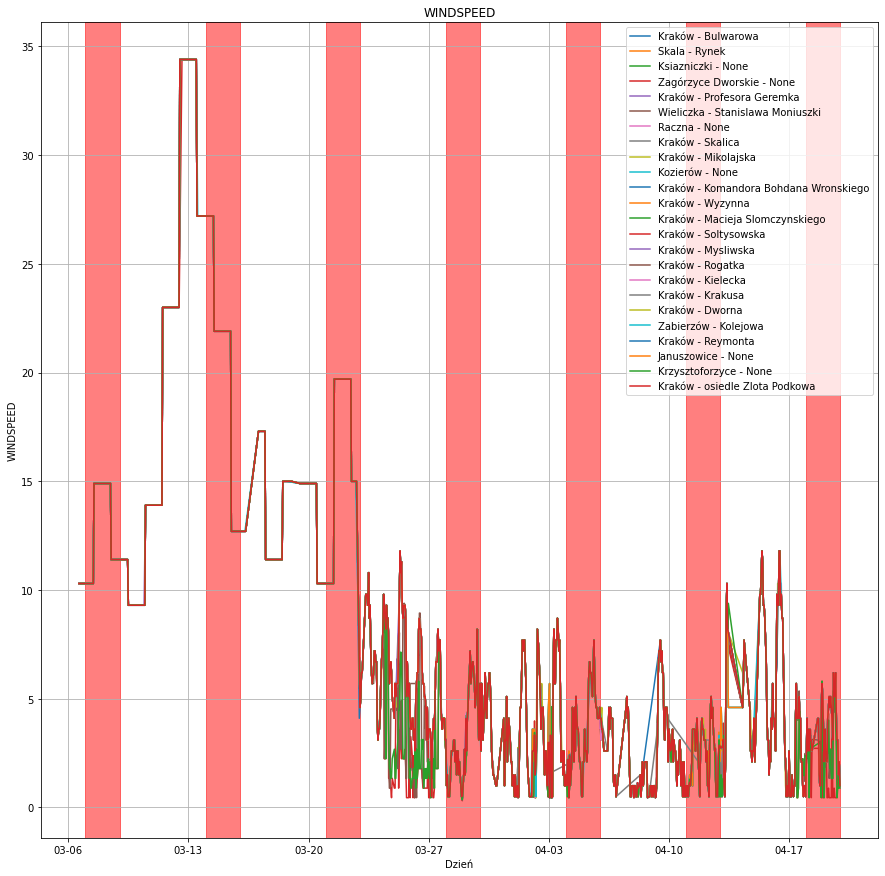

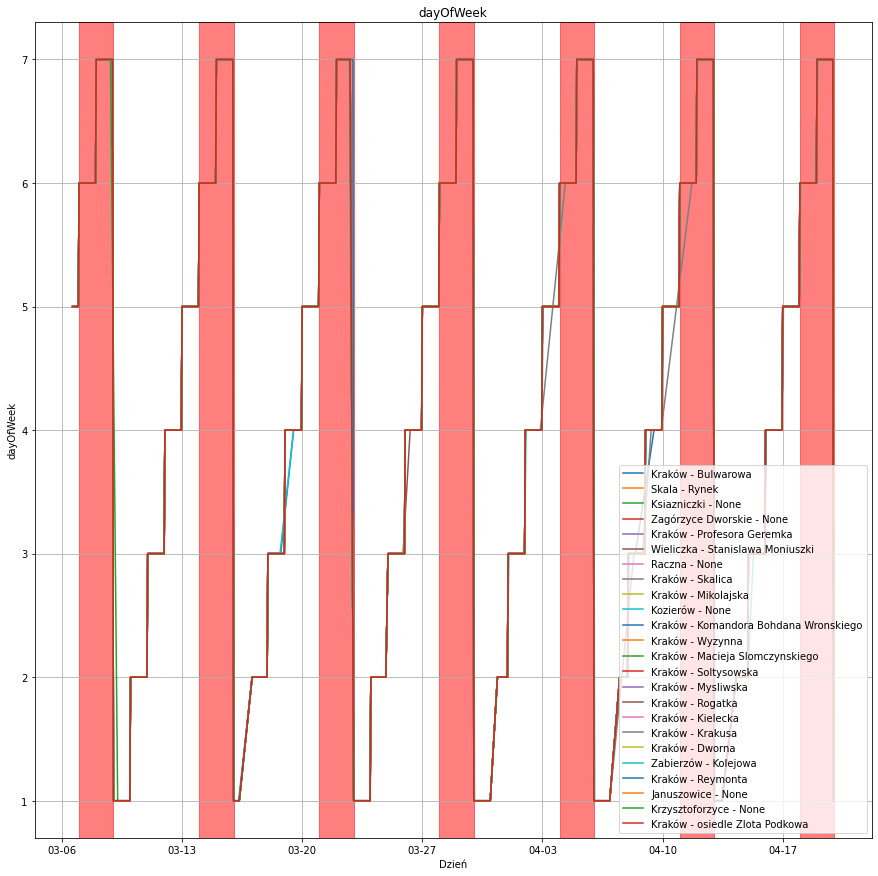

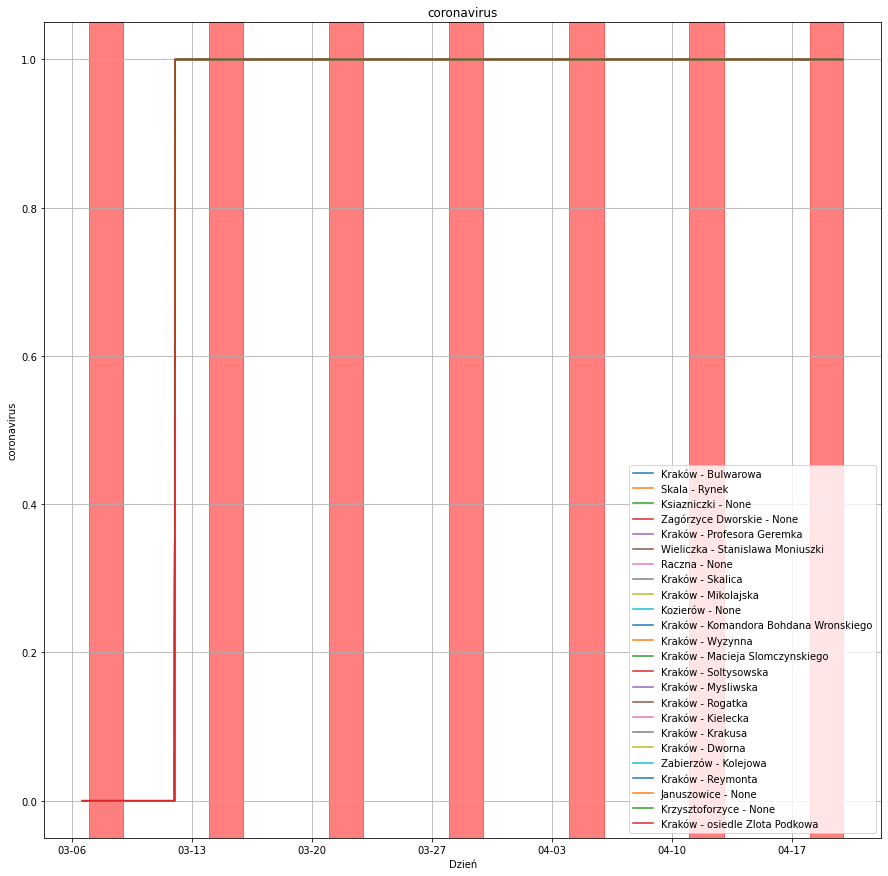

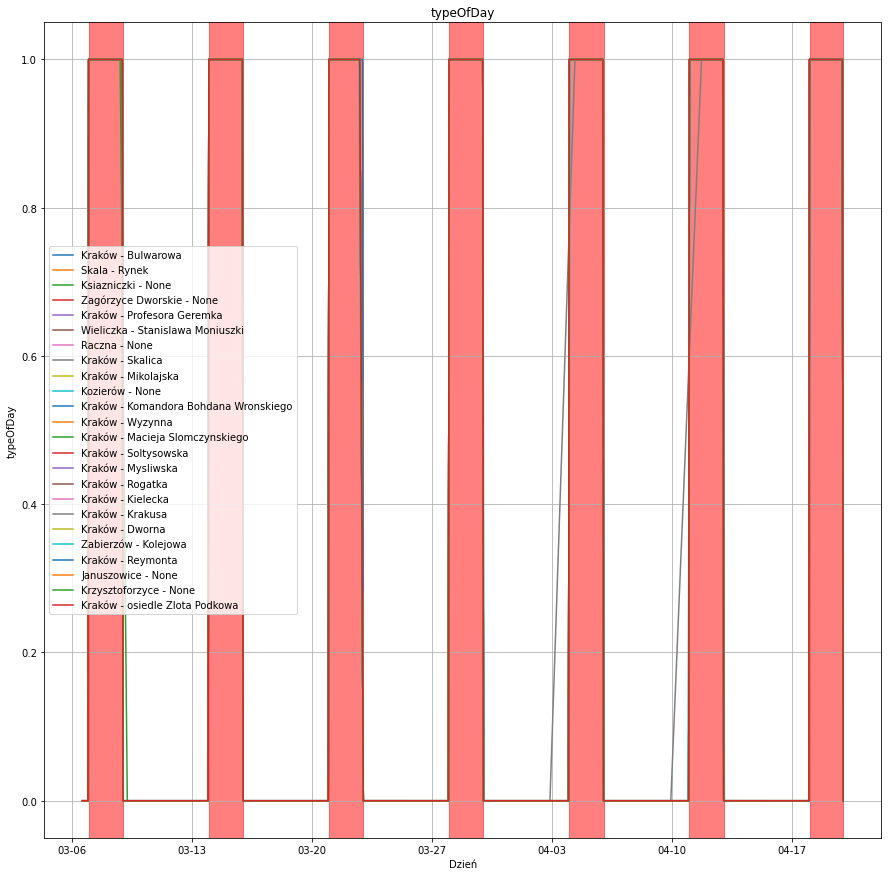

In [126]:
columns_to_plot = np.delete(df.columns.values, (0, 1, 2))
columns_to_plot
for col in columns_to_plot:
    plotAllData(col)

In [130]:
which_measure = 1

def plot_humidity(installation_id):
    measurements = measurements_by_installation_id[installation_id]
    if(measurements['HUMIDITY'].isnull().all()):
        return
    
    days = mdates.DayLocator()
    days_fmt = mdates.DateFormatter('%m-%d')

    fig, ax = plt.subplots()

    fig.set_figheight(15)
    fig.set_figwidth(15)
    
    ax.plot(measurements.fromDataTime, measurements['HUMIDITY'], label=installations_labels[installation_id])

    ax.xaxis.set_major_locator(days)
    ax.xaxis.set_major_formatter(days_fmt)
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=7))
    for weekend in getWeekends(measurements[['fromDataTime', 'typeOfDay']]):
        plt.axvspan(weekend[0], weekend[1], color='red', alpha=0.5)
    ax.grid(True)

    plt.xlabel('Dzień')
    plt.ylabel('Wilgotność [%]')
    plt.title('Wilgotność dla czujnika: %s' % (installations_labels[installation_id]))

    plot_name = 'HUMIDITY_' + str(installation_id)
    plt.savefig('./plots/%s_%d.png' % (plot_name, which_measure))
    plt.show()

In [131]:
def plot_temperature(installation_id):
    measurements = measurements_by_installation_id[installation_id]
    if(measurements['TEMPERATURE'].isnull().all()):
        return
    
    days = mdates.DayLocator()
    days_fmt = mdates.DateFormatter('%m-%d')

    fig, ax = plt.subplots()

    fig.set_figheight(15)
    fig.set_figwidth(15)
    
    ax.plot(measurements.fromDataTime, measurements['TEMPERATURE'], label=installations_labels[installation_id])

    ax.xaxis.set_major_locator(days)
    ax.xaxis.set_major_formatter(days_fmt)
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=7))
    for weekend in getWeekends(measurements[['fromDataTime', 'typeOfDay']]):
        plt.axvspan(weekend[0], weekend[1], color='red', alpha=0.5)
    ax.grid(True)

    plt.xlabel('Dzień')
    plt.ylabel('Temperatura [C]')
    plt.title('Temperatura dla czujnika: %s' % (installations_labels[installation_id]))

    plot_name = 'TEMPERATURE_' + str(installation_id)
    plt.savefig('./plots/%s_%d.png' % (plot_name, which_measure))
    plt.show()

## Wykresy temperatury dla każdej stacji

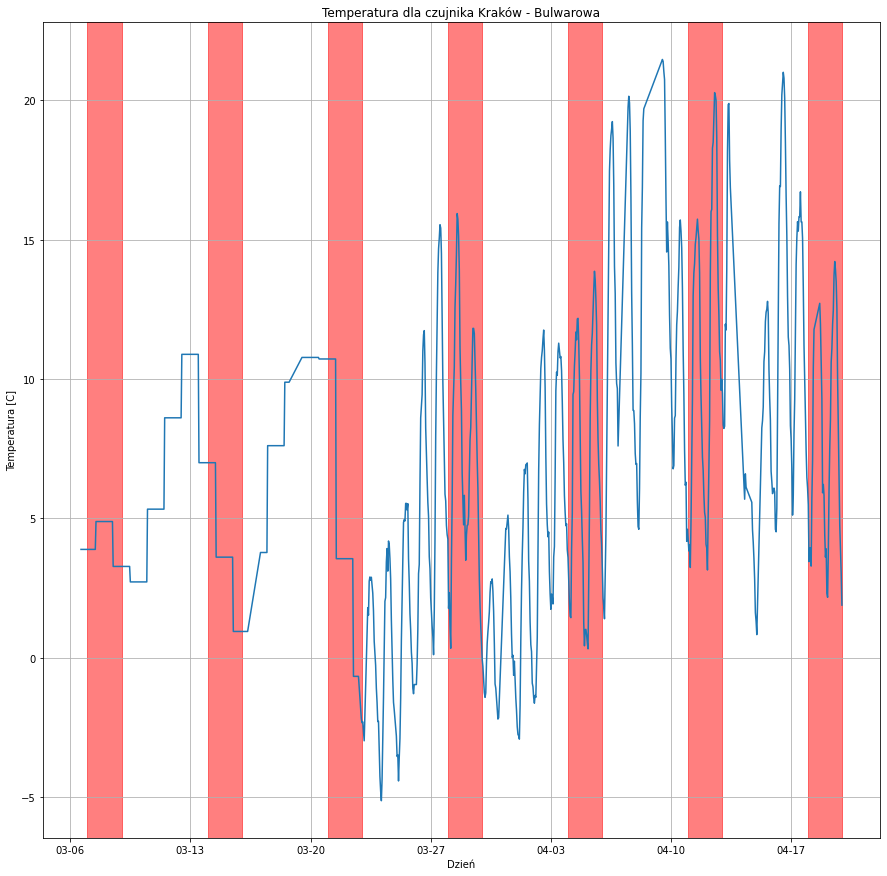

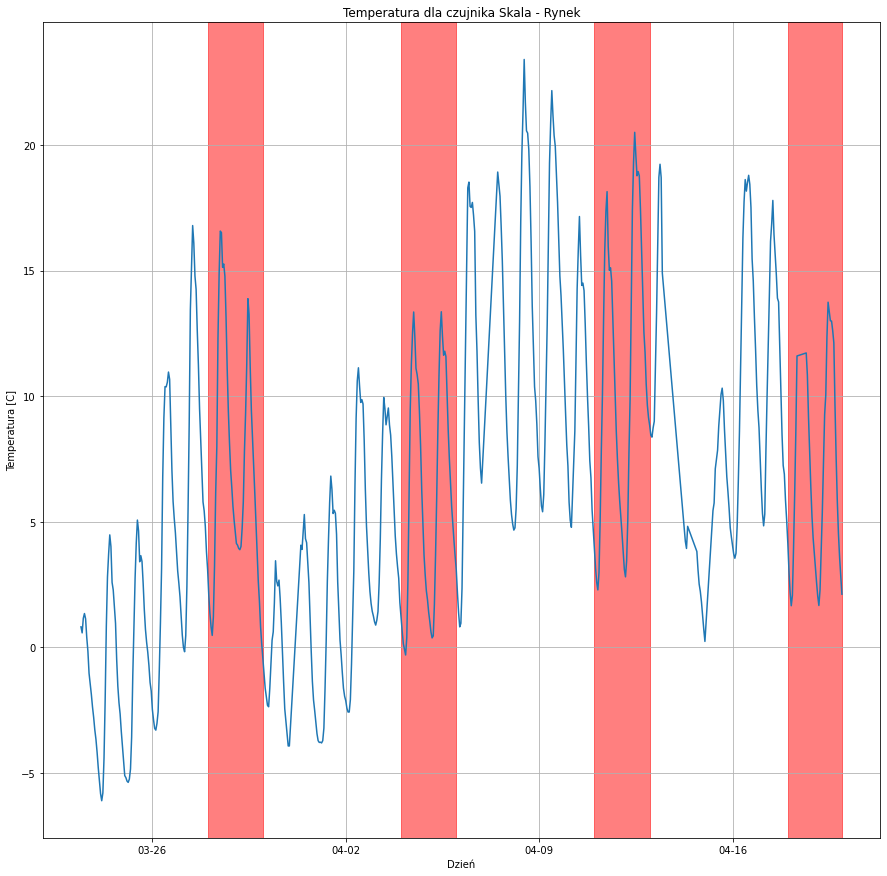

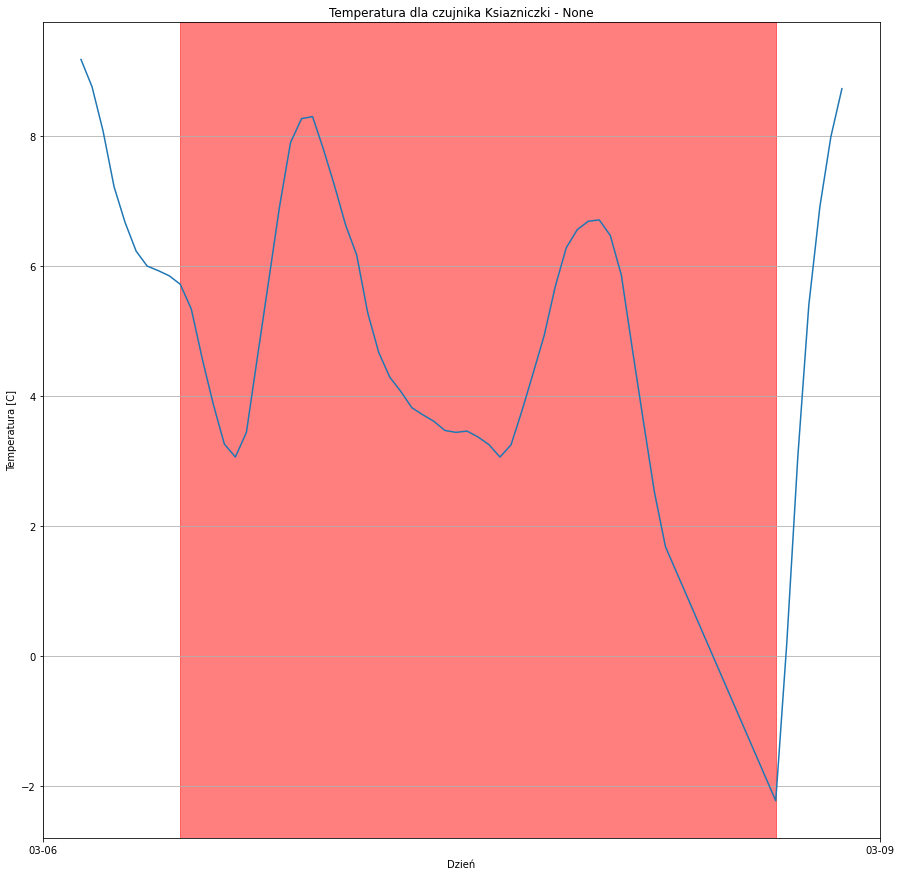

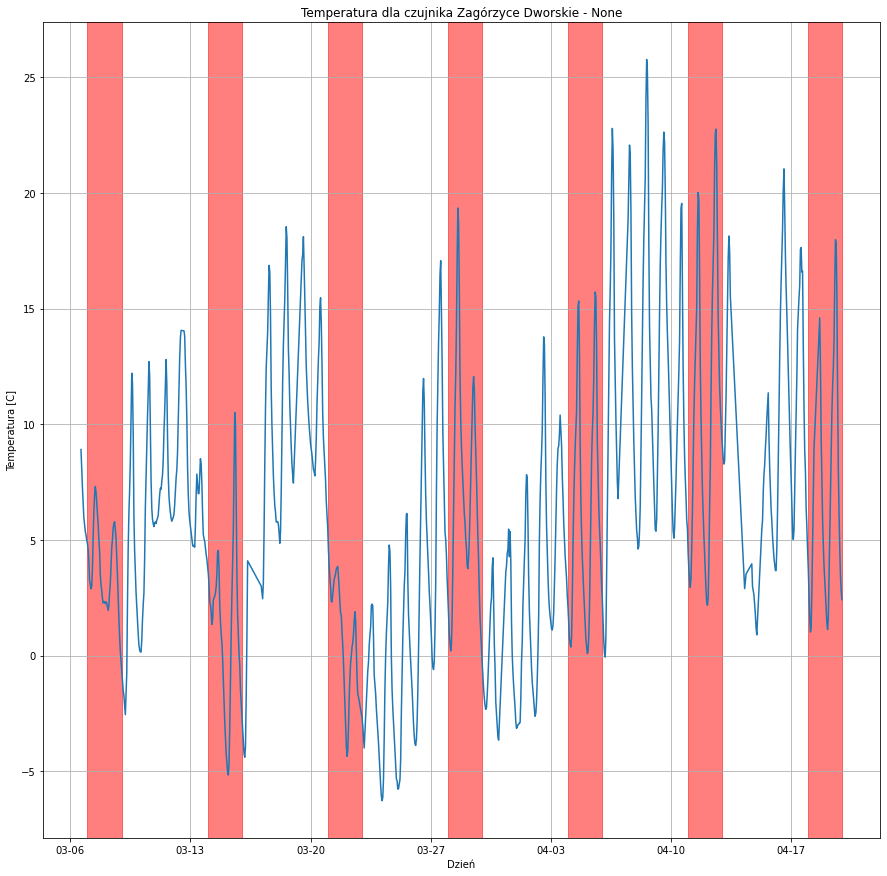

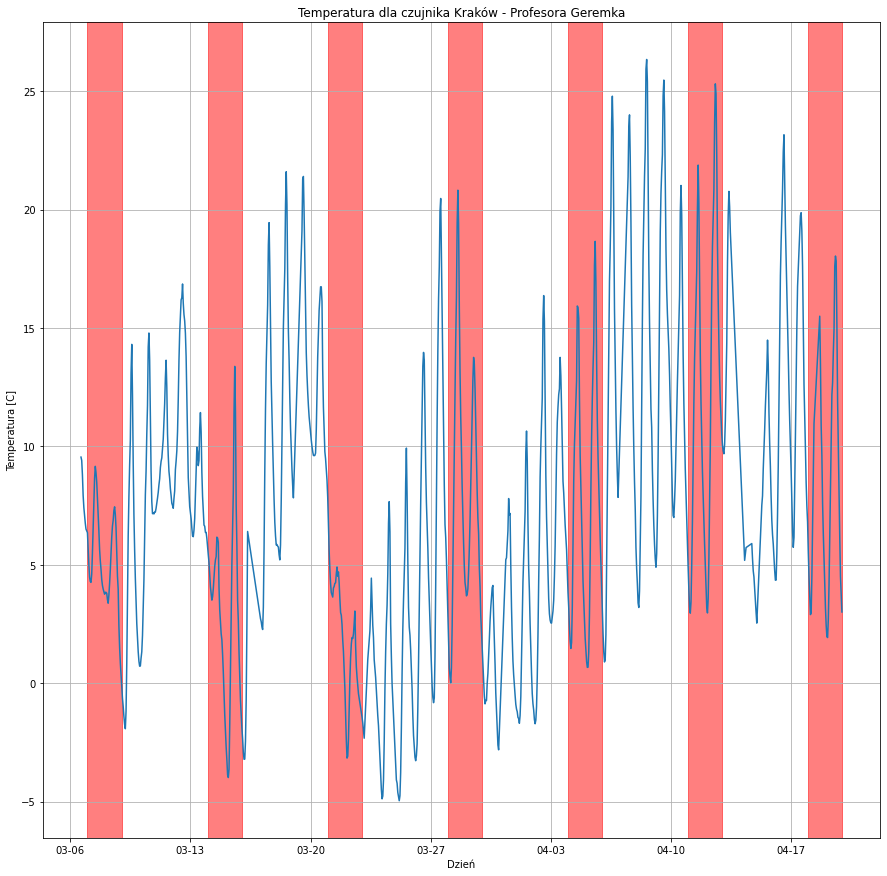

...

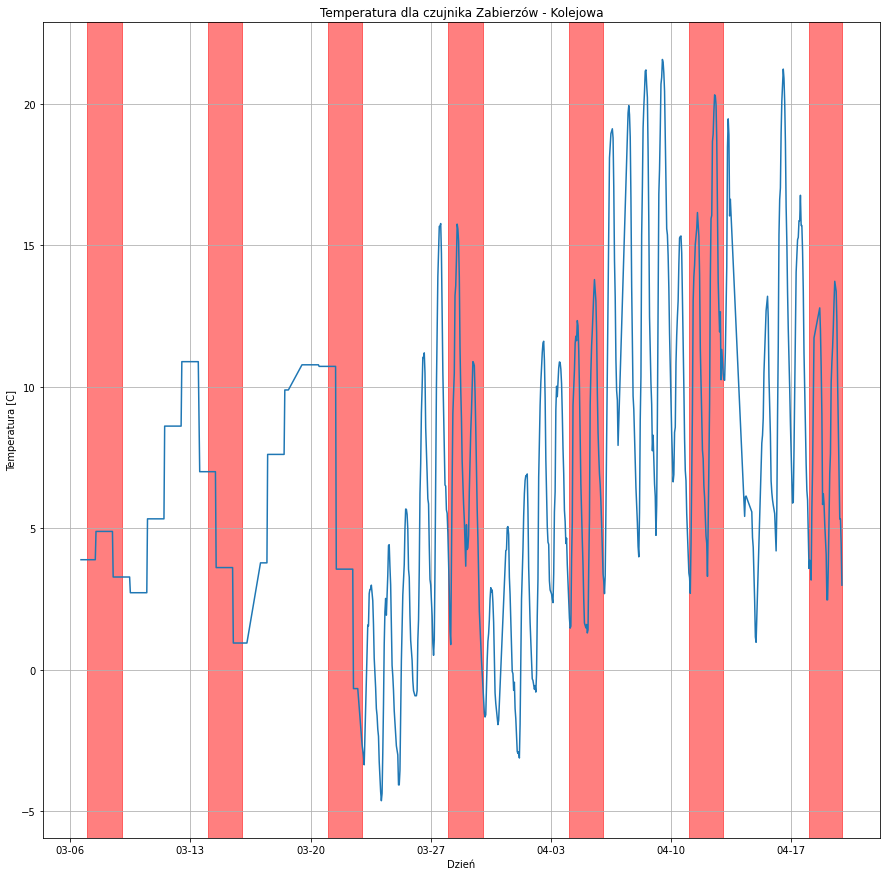

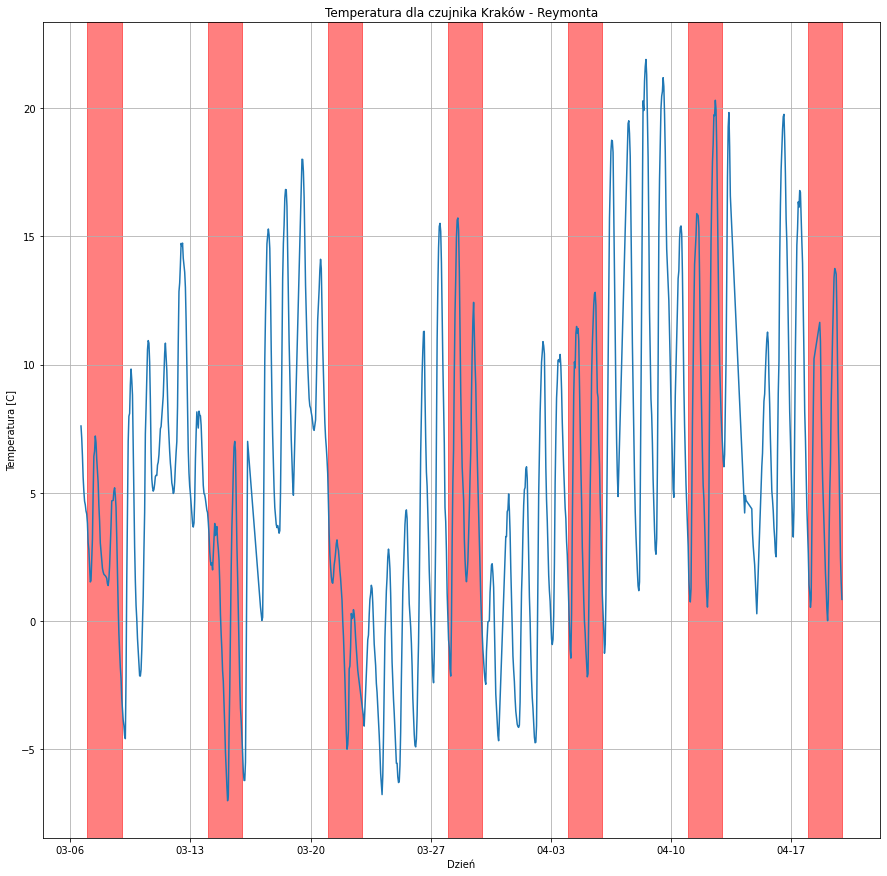

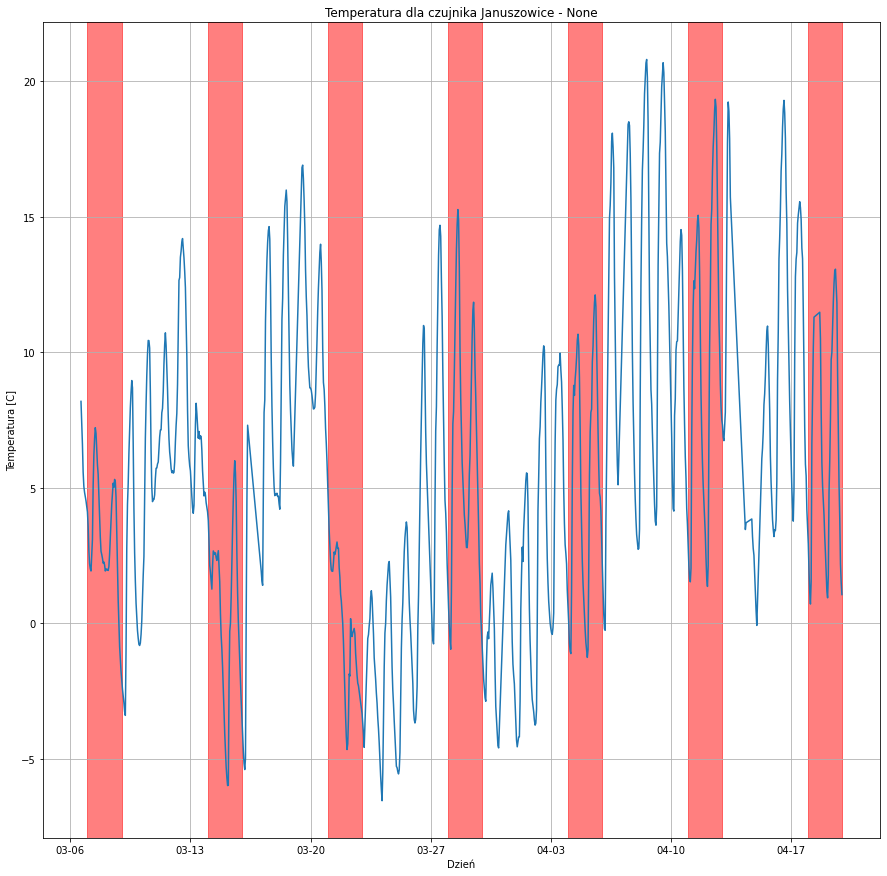

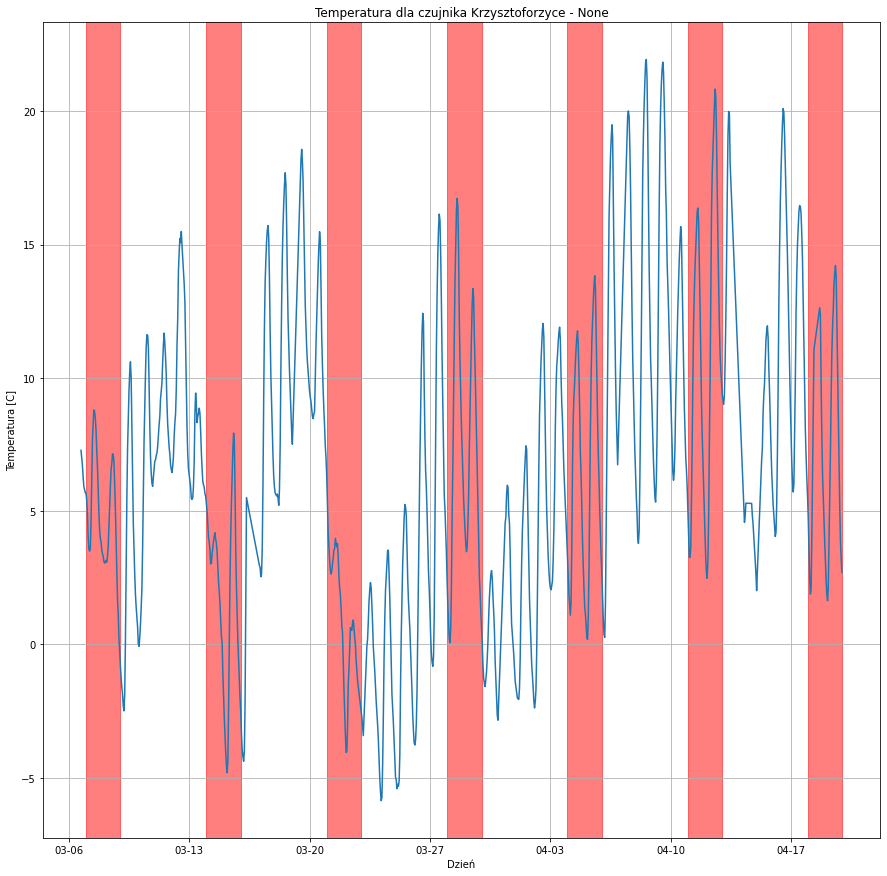

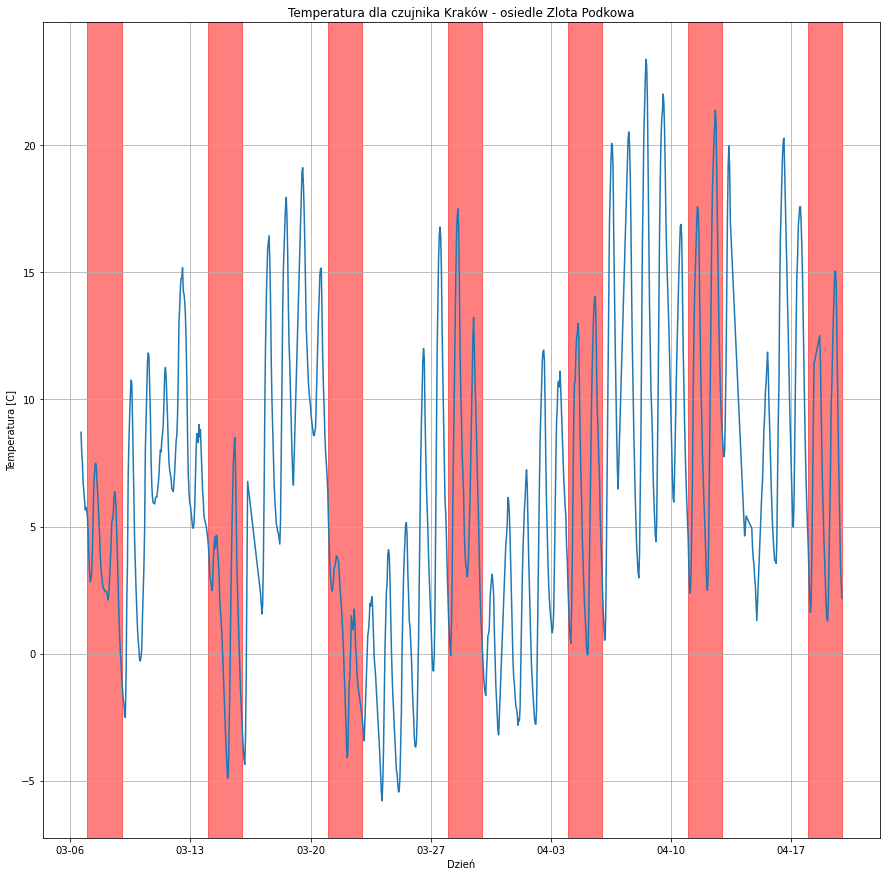

In [132]:
for id in installationd_id:
    plot_temperature(id)

## Wykresy wilgotności dla każdej stacji

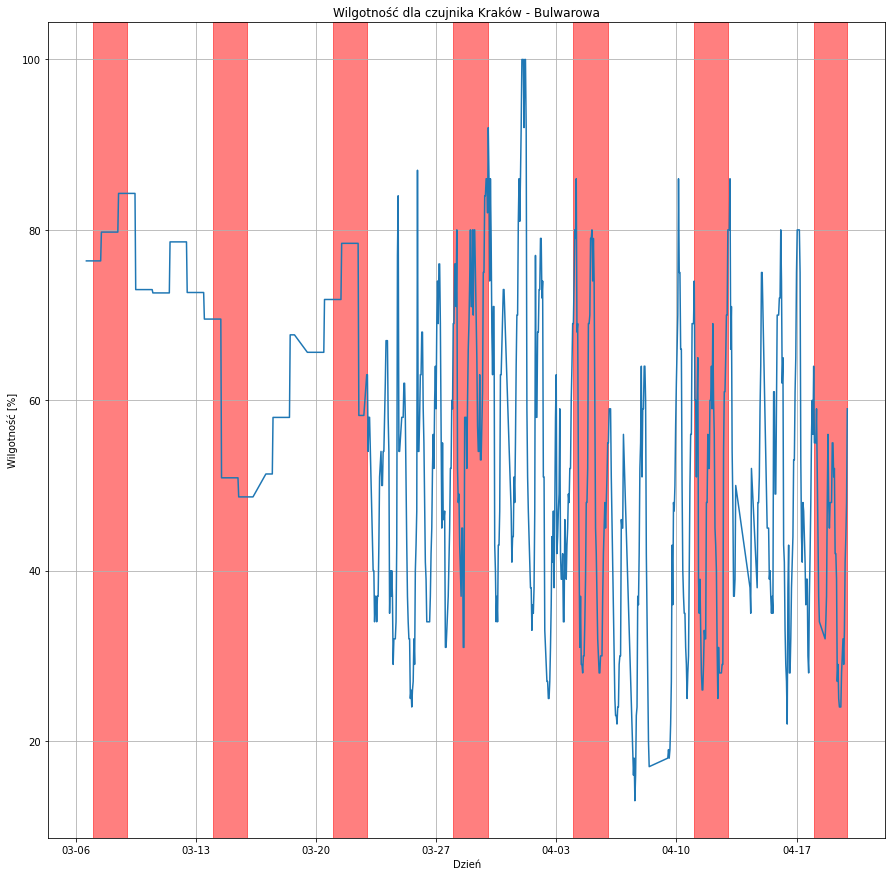

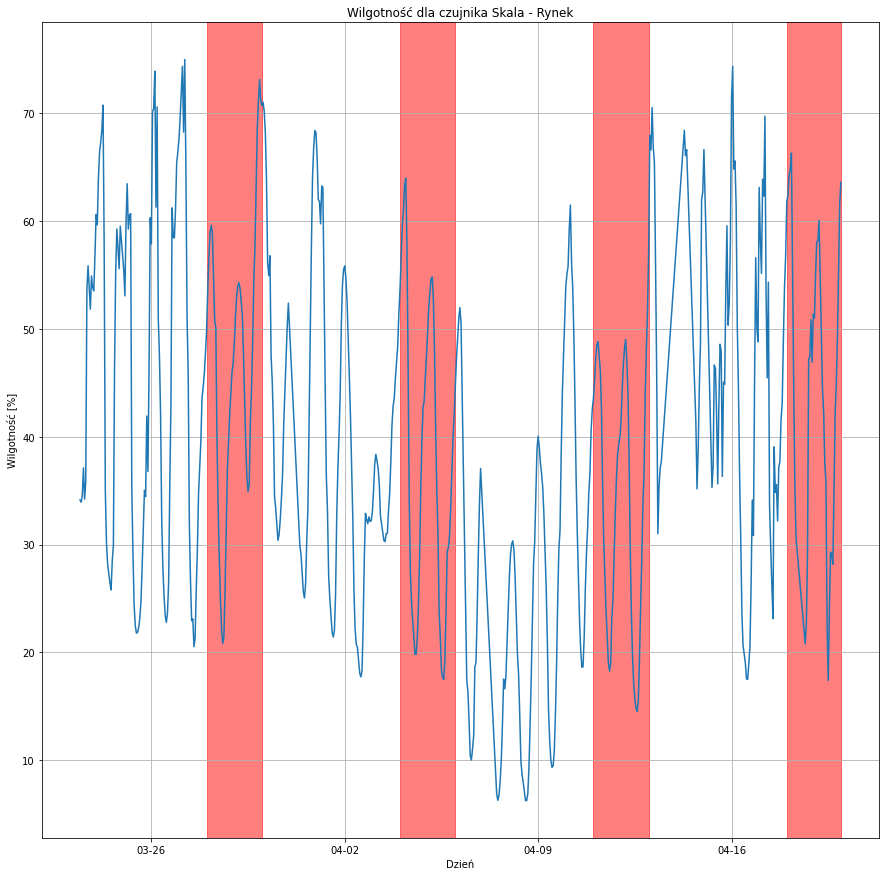

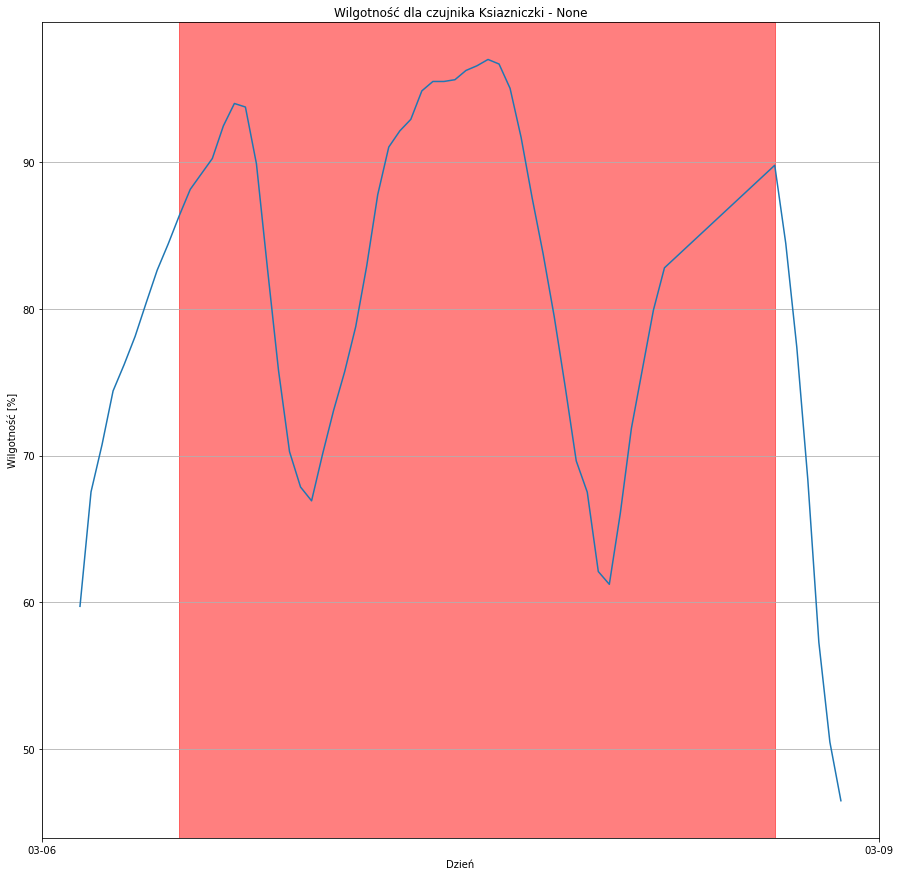

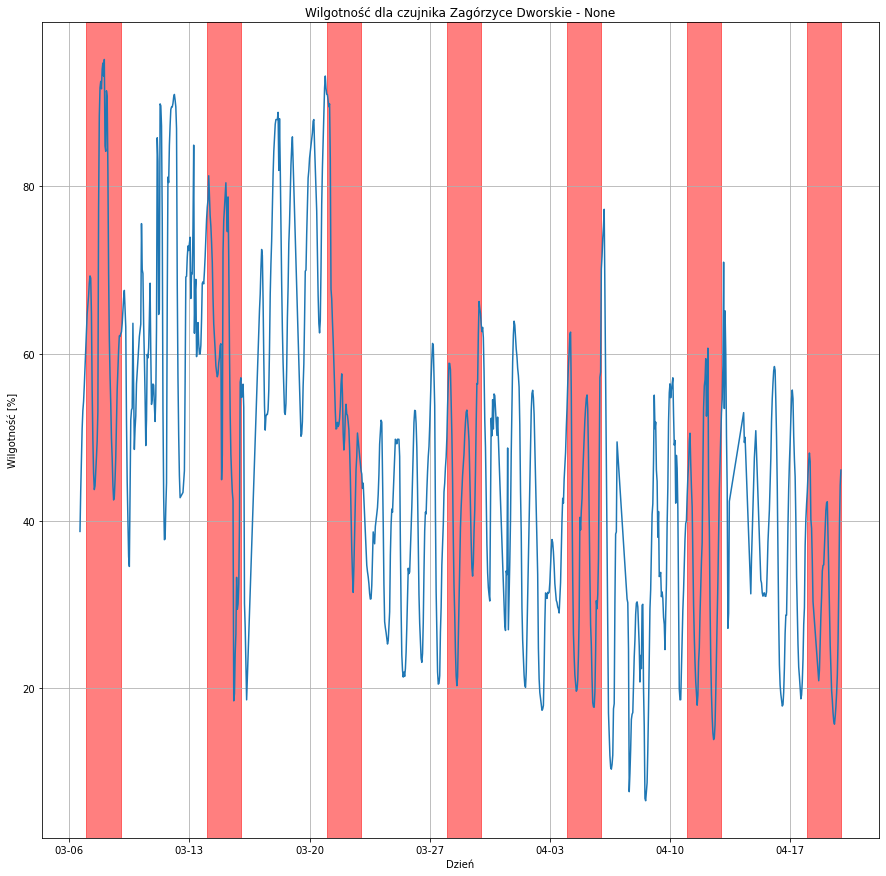

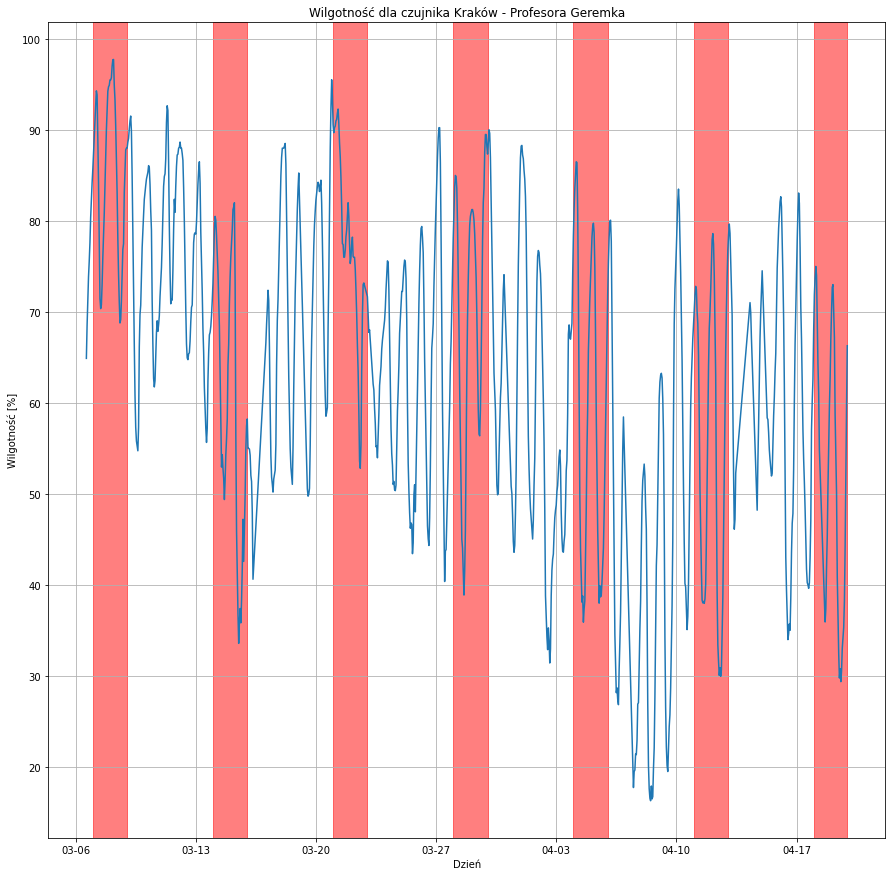

...

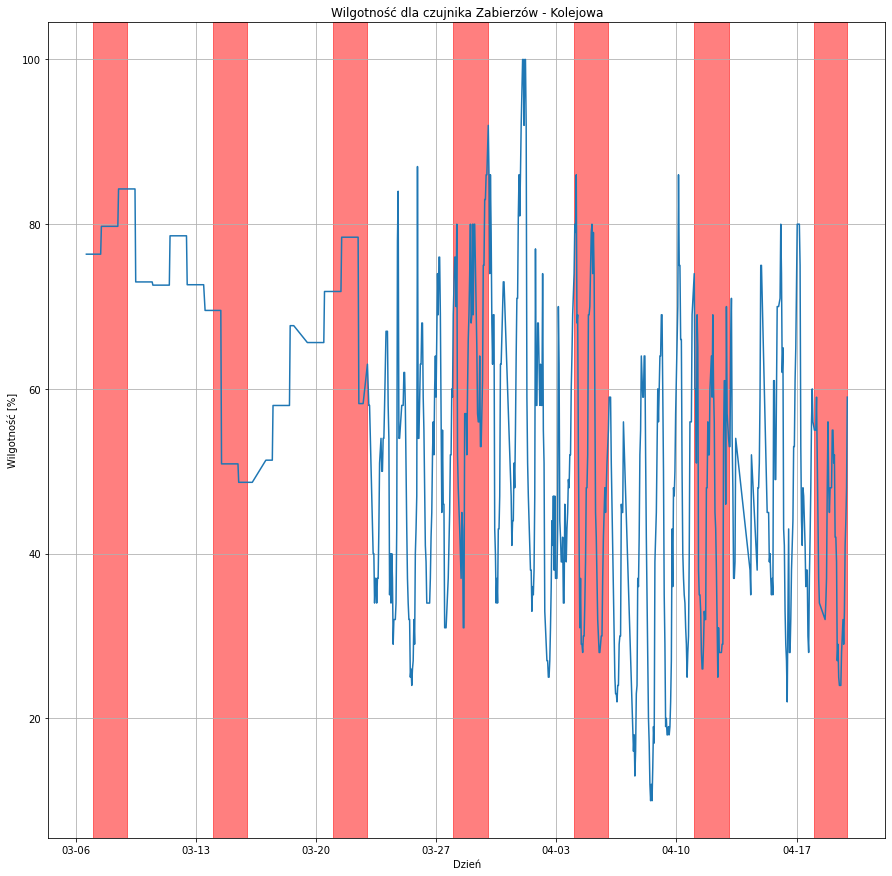

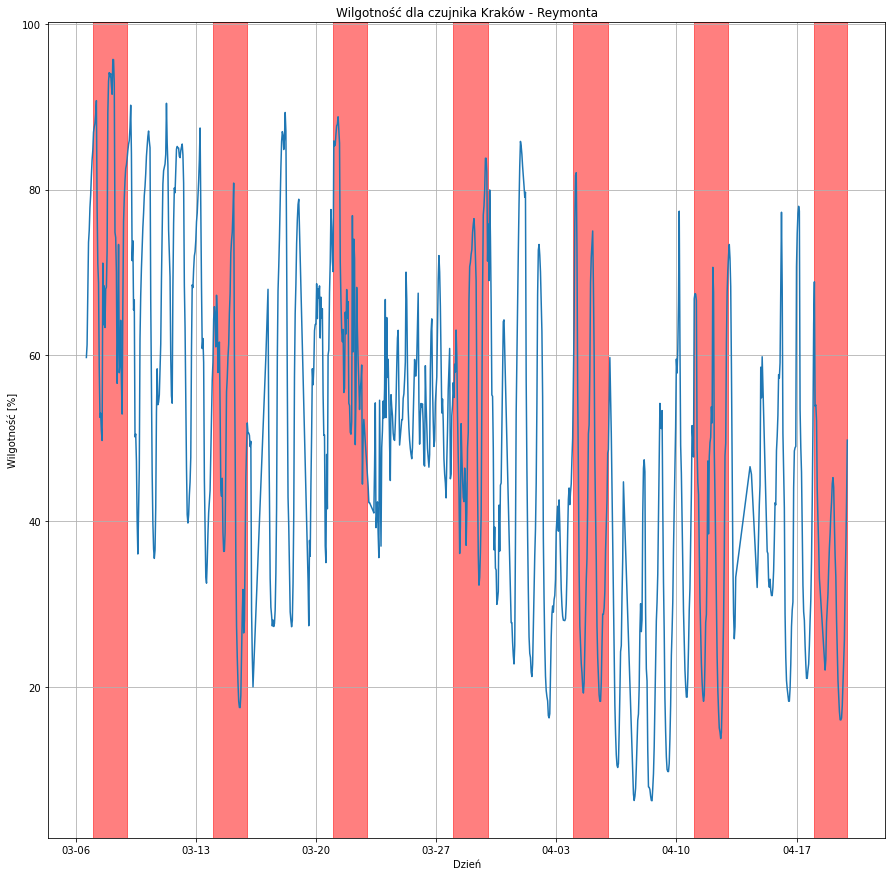

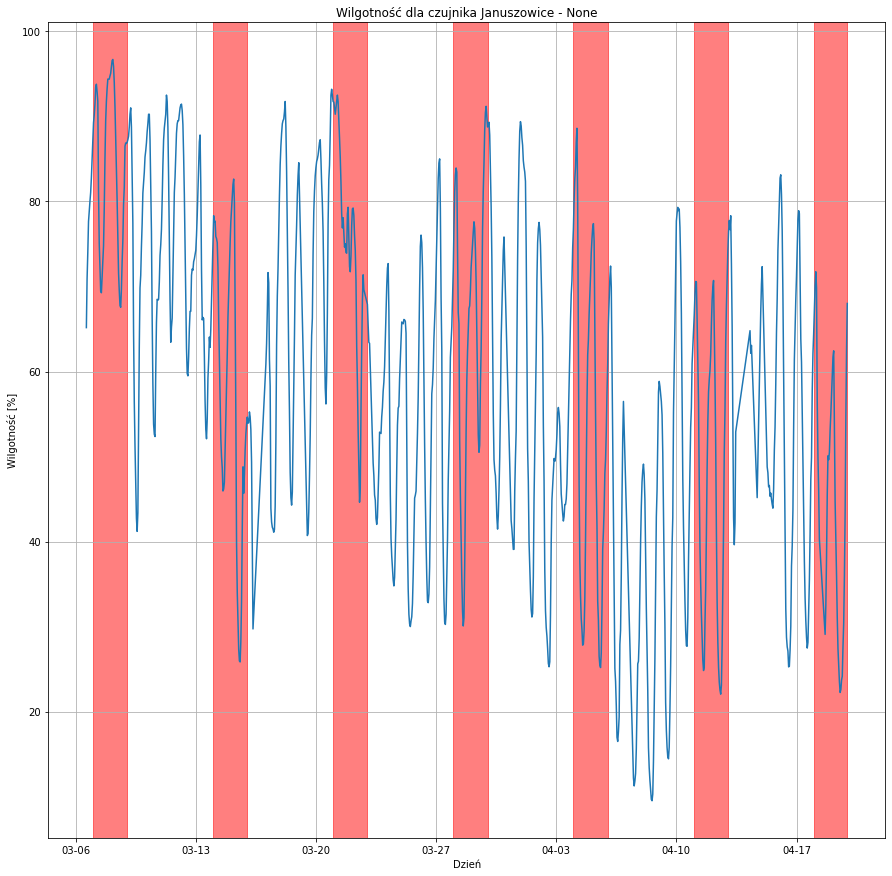

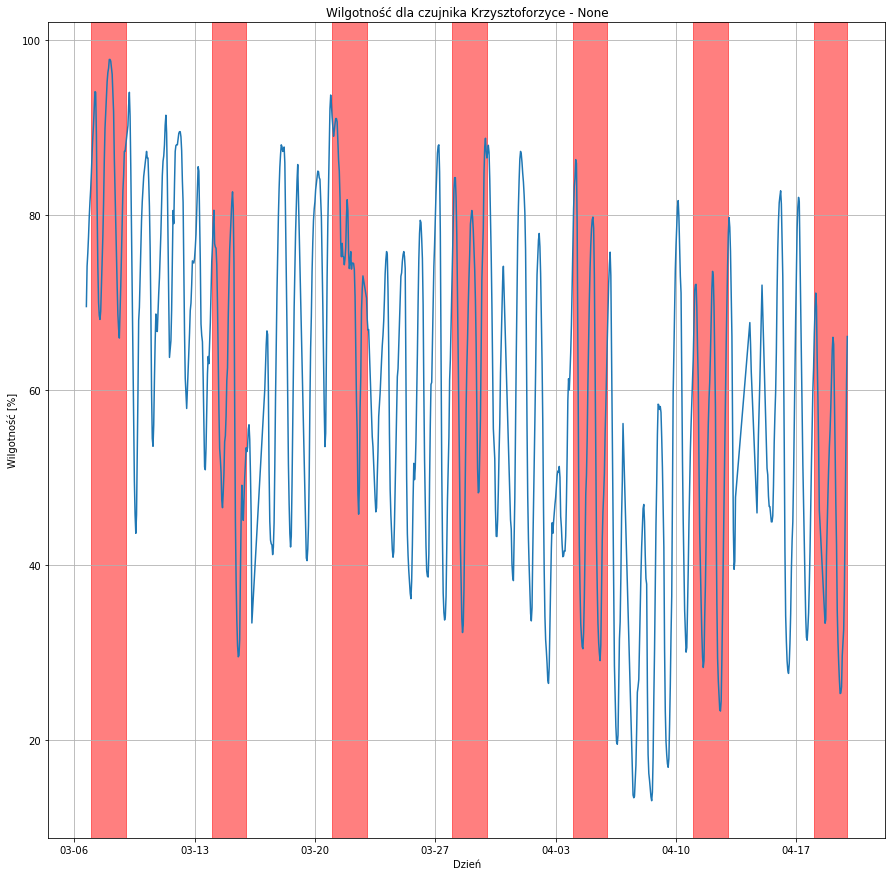

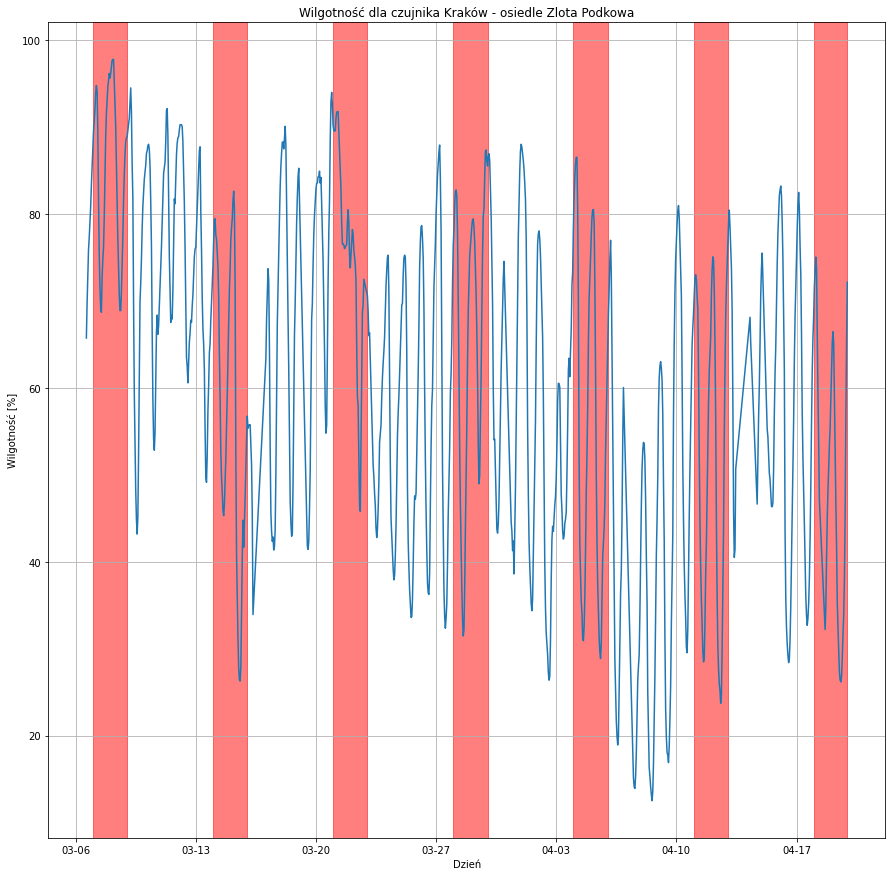

In [134]:
for id in installationd_id:
    plot_humidity(id)

## Wykresy dla każdego z kierunku

In [135]:
def plotDataForRegion(installationIds, column, title):
    days = mdates.DayLocator()
    days_fmt = mdates.DateFormatter('%m-%d')

    fig, ax = plt.subplots()

    fig.set_figheight(15)
    fig.set_figwidth(15)
    for id in installationIds:
        measurements = df.loc[df['installationId'] == id]
        ax.plot(measurements.fromDataTime, measurements[column], label=installations_labels[id])

    ax.xaxis.set_major_locator(days)
    ax.xaxis.set_major_formatter(days_fmt)
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=7))
    for weekend in getWeekends(measurements[['fromDataTime', 'typeOfDay']]):
        plt.axvspan(weekend[0], weekend[1], color='red', alpha=0.5)
    ax.grid(True)

    plt.xlabel('Dzień')
    plt.ylabel(column)
    plt.title(title)
    plt.legend()

    plt.show()

In [136]:
# north = [313, 8126, 332, 10051, 329, 9899]
# east = [11336, 19, 6076, 9902, 9891, 9903, 9919]
# south = [9892, 1070, 7514, 9920, 9905]
# west = [7012, 9996, 9923, 11489, 10039, 8077]

north = installations[installations['region'] == 'N']['id']
east = installations[installations['region'] == 'E']['id']
south = installations[installations['region'] == 'S']['id']
west = installations[installations['region'] == 'W']['id']

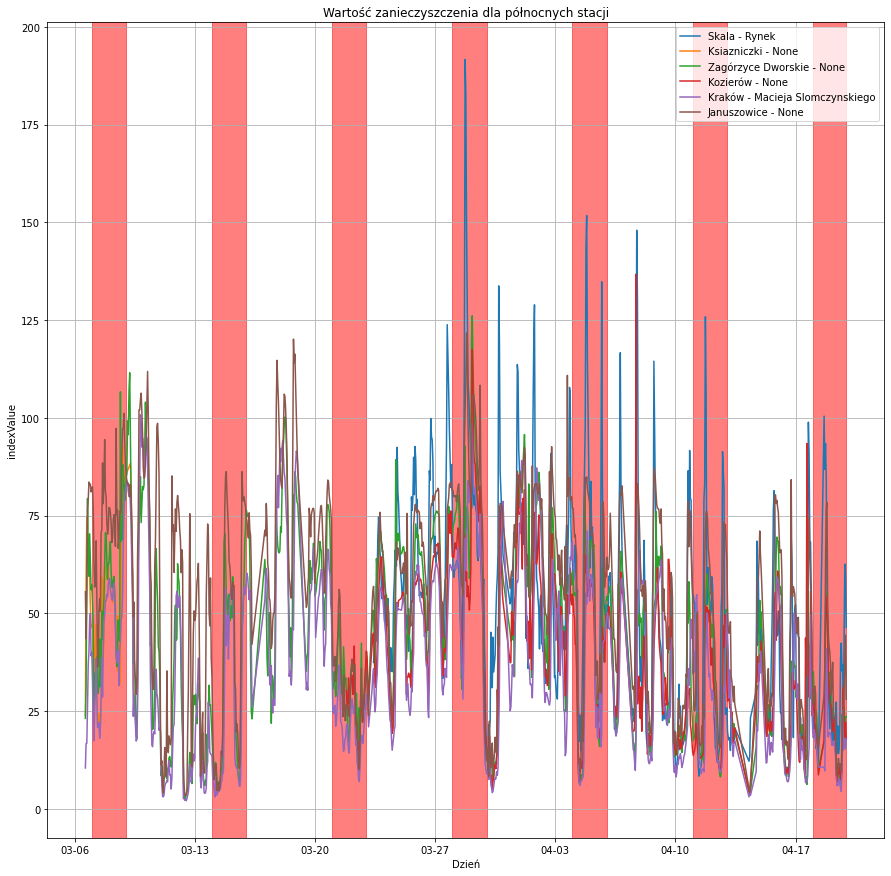

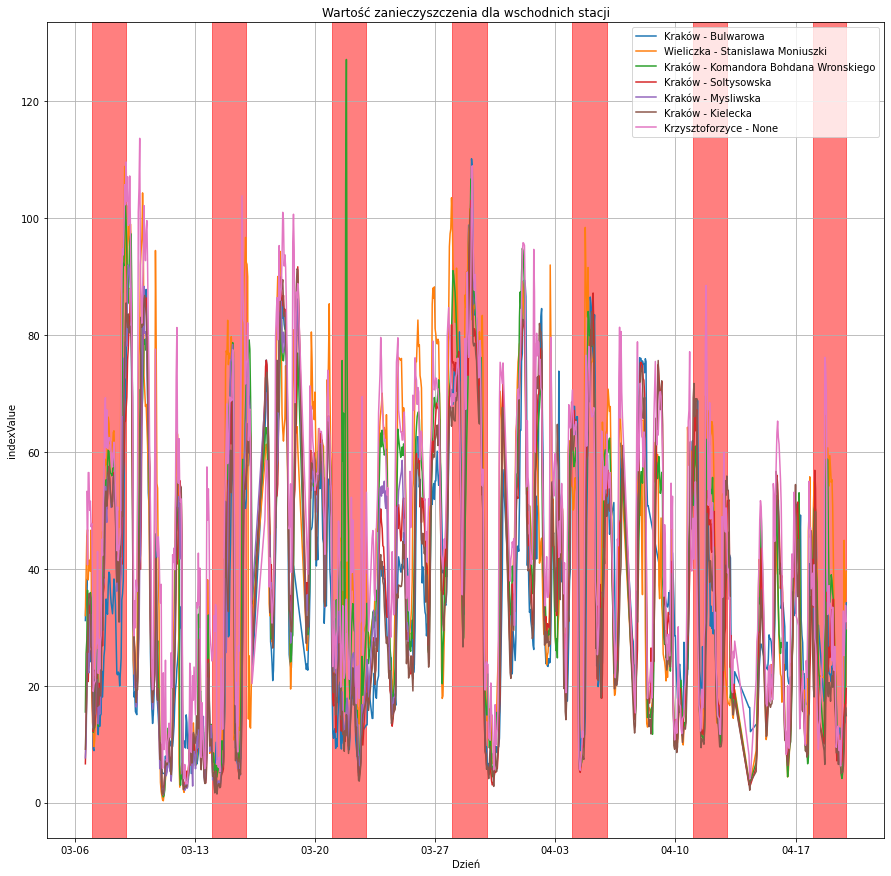

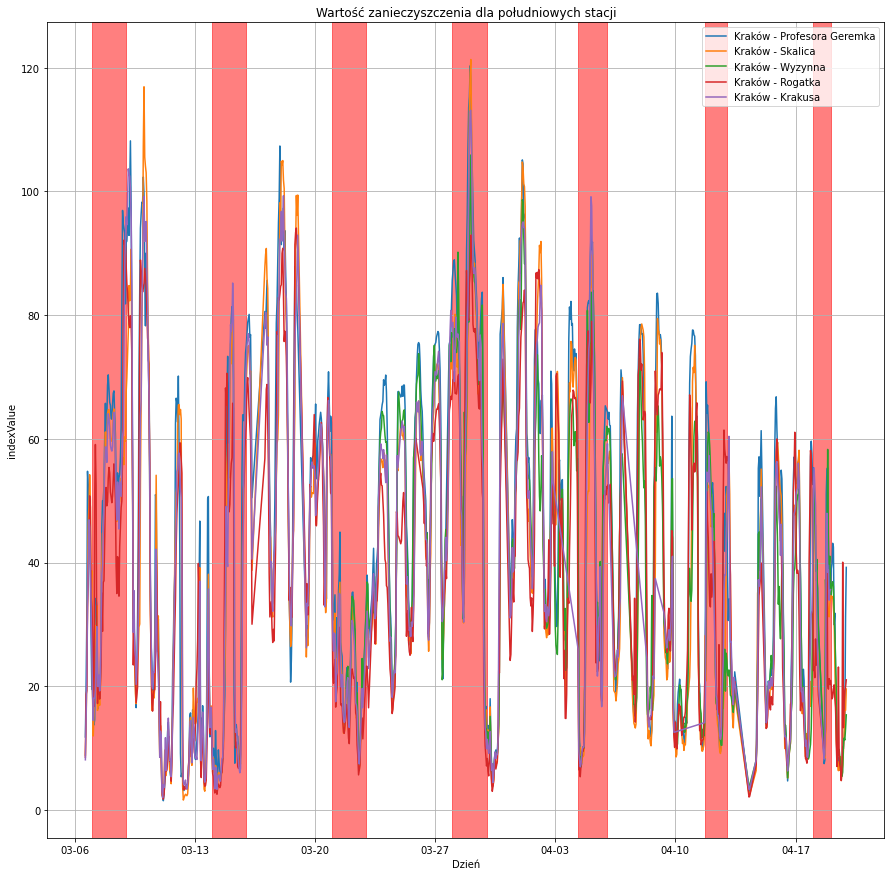

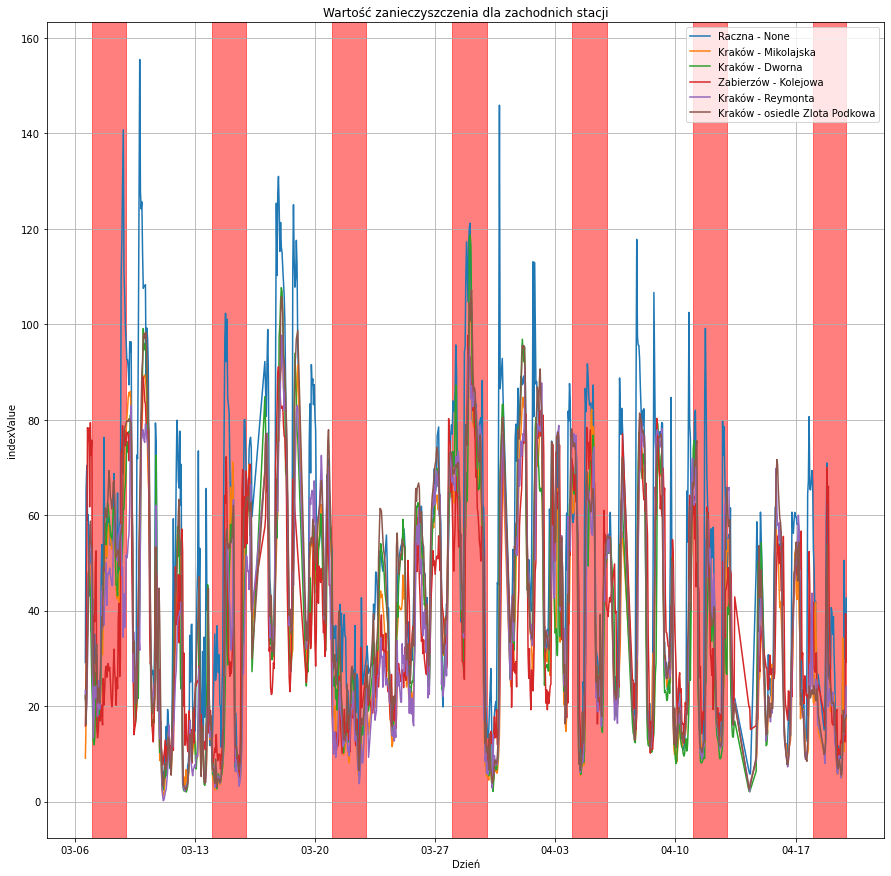

In [137]:
plotDataForRegion(north, 'indexValue', 'Wartość zanieczyszczenia dla północnych stacji')
plotDataForRegion(east, 'indexValue', 'Wartość zanieczyszczenia dla wschodnich stacji')
plotDataForRegion(south, 'indexValue', 'Wartość zanieczyszczenia dla południowych stacji')
plotDataForRegion(west, 'indexValue', 'Wartość zanieczyszczenia dla zachodnich stacji')

## Przetwarzanie danych

In [138]:
from sklearn import preprocessing

data = df.drop(['installationId', 'fromDataTime', 'tillDateTime', 'indexLevel'] , axis='columns')
data.corr()

,PM1,PM25,PM10,PRESSURE,HUMIDITY,TEMPERATURE,indexValue,NO2,CO,CLOUDCOVER,WINDDIRECTION,WINDSPEED,dayOfWeek,coronavirus,typeOfDay
PM1,1.000000,0.989506,0.968531,0.049999,0.294171,-0.286348,0.925025,NaN,NaN,-0.122560,-0.033641,-0.198754,-0.069045,-0.070069,-0.028722
PM25,0.989506,1.000000,0.981608,0.040814,0.310730,-0.297599,0.929732,0.397863,0.827622,-0.115046,-0.027580,-0.198294,-0.058722,-0.068708,-0.019461
PM10,0.968531,0.981608,1.000000,0.054540,0.311364,-0.318078,0.953350,0.504481,0.867205,-0.133221,-0.041167,-0.220017,-0.061295,-0.064877,-0.028736
PRESSURE,0.049999,0.040814,0.054540,1.000000,-0.175500,-0.262112,0.091454,-0.161708,0.001206,-0.269613,-0.370479,-0.162719,-0.155444,0.428887,0.003495
HUMIDITY,0.294171,0.310730,0.311364,-0.175500,1.000000,-0.521150,0.320950,0.233088,0.090257,0.234892,0.058457,0.285276,0.062894,-0.363813,0.077462
TEMPERATURE,-0.286348,-0.297599,-0.318078,-0.262112,-0.521150,1.000000,-0.346791,-0.107833,-0.152973,-0.084002,0.207152,-0.035157,0.068732,0.084315,-0.098577
indexValue,0.925025,0.929732,0.953350,0.091454,0.320950,-0.346791,1.000000,0.508862,0.853463,-0.177467,-0.083800,-0.260483,-0.063728,-0.047396,-0.046264
NO2,NaN,0.397863,0.504481,-0.161708,0.233088,-0.107833,0.508862,1.000000,0.595287,-0.176915,0.087736,-0.083318,-0.167740,-0.199670,-0.241926
CO,NaN,0.827622,0.867205,0.001206,0.090257,-0.152973,0.853463,0.595287,1.000000,-0.223702,-0.076082,-0.428226,-0.101763,0.047215,-0.055104
CLOUDCOVER,-0.122560,-0.115046,-0.133221,-0.269613,0.234892,-0.084002,-0.177467,-0.176915,-0.223702,1.000000,0.104793,0.191457,0.231687,-0.127537,0.213433


## Wykres korelacji

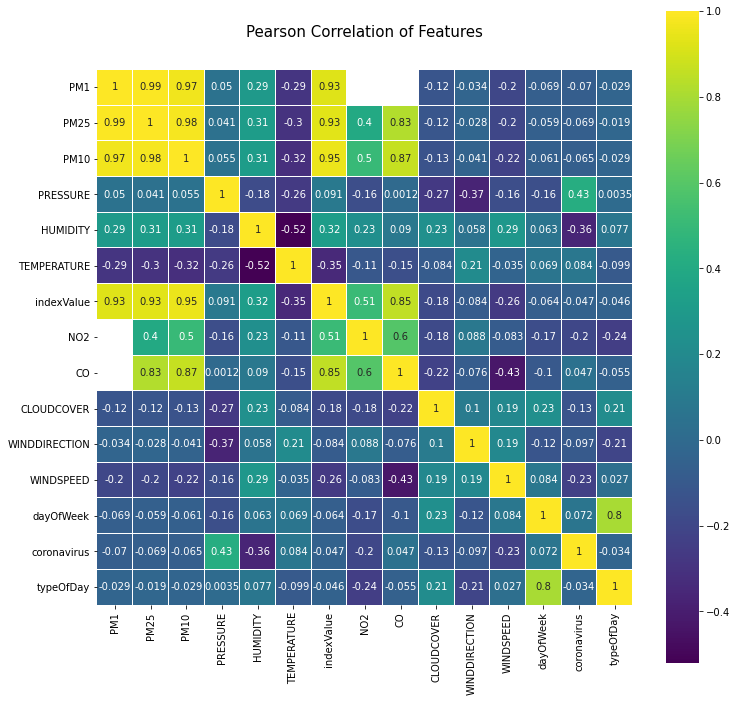

In [139]:
import seaborn as sns

colormap = plt.cm.viridis
plt.figure(figsize=(12,12))
plt.title('Pearson Correlation of Features', y=1.05, size=15)
sns.heatmap(data.astype(float).corr(),linewidths=0.1,vmax=1.0,
square=True, cmap=colormap, linecolor='white', annot=True)

## Korelacja pomiędzy temperaturą, wilgotnością a prędkością wiatru

In [140]:
from IPython.display import display, HTML

for id in installationd_id:
    dd = df.loc[df['installationId'] == id][['TEMPERATURE', 'HUMIDITY', 'WINDSPEED']]
    cor = dd.corr()
    print('Czujnik: ' + str(id))
    display(HTML(cor.to_html()))
    print()

Czujnik: 19


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.493245,0.009960
HUMIDITY,-0.493245,1.000000,0.318049
WINDSPEED,0.009960,0.318049,1.000000



Czujnik: 313


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.720049,0.084124
HUMIDITY,-0.720049,1.000000,-0.218868
WINDSPEED,0.084124,-0.218868,1.000000



Czujnik: 329


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.730847,-0.230296
HUMIDITY,-0.730847,1.000000,0.404991
WINDSPEED,-0.230296,0.404991,1.000000



Czujnik: 332


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.386864,-0.059329
HUMIDITY,-0.386864,1.000000,0.519474
WINDSPEED,-0.059329,0.519474,1.000000



Czujnik: 1070


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.607651,-0.032399
HUMIDITY,-0.607651,1.000000,0.277616
WINDSPEED,-0.032399,0.277616,1.000000



Czujnik: 6076


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.604342,-0.025379
HUMIDITY,-0.604342,1.000000,0.269467
WINDSPEED,-0.025379,0.269467,1.000000



Czujnik: 7012


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.586452,-0.021672
HUMIDITY,-0.586452,1.000000,0.279005
WINDSPEED,-0.021672,0.279005,1.000000



Czujnik: 7514


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.620606,-0.038376
HUMIDITY,-0.620606,1.000000,0.270588
WINDSPEED,-0.038376,0.270588,1.000000



Czujnik: 8077


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.549039,-0.062721
HUMIDITY,-0.549039,1.000000,0.257140
WINDSPEED,-0.062721,0.257140,1.000000



Czujnik: 8126


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.693683,-0.162279
HUMIDITY,-0.693683,1.000000,-0.043943
WINDSPEED,-0.162279,-0.043943,1.000000



Czujnik: 9891


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.62084,-0.026536
HUMIDITY,-0.620840,1.00000,0.253680
WINDSPEED,-0.026536,0.25368,1.000000



Czujnik: 9892


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.00000,-0.765450,-0.111210
HUMIDITY,-0.76545,1.000000,-0.049438
WINDSPEED,-0.11121,-0.049438,1.000000



Czujnik: 9899


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.510888,-0.057436
HUMIDITY,-0.510888,1.000000,0.295007
WINDSPEED,-0.057436,0.295007,1.000000



Czujnik: 9902


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.516696,-0.055588
HUMIDITY,-0.516696,1.000000,0.304588
WINDSPEED,-0.055588,0.304588,1.000000



Czujnik: 9903


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.129687,0.254559
HUMIDITY,-0.129687,1.000000,0.009019
WINDSPEED,0.254559,0.009019,1.000000



Czujnik: 9905


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.516848,-0.049054
HUMIDITY,-0.516848,1.000000,0.296642
WINDSPEED,-0.049054,0.296642,1.000000



Czujnik: 9919


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.542631,-0.048552
HUMIDITY,-0.542631,1.000000,0.292921
WINDSPEED,-0.048552,0.292921,1.000000



Czujnik: 9920


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.496454,-0.021719
HUMIDITY,-0.496454,1.000000,0.269365
WINDSPEED,-0.021719,0.269365,1.000000



Czujnik: 9923


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.537130,-0.020536
HUMIDITY,-0.537130,1.000000,0.299901
WINDSPEED,-0.020536,0.299901,1.000000



Czujnik: 9996


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.531547,-0.043410
HUMIDITY,-0.531547,1.000000,0.355618
WINDSPEED,-0.043410,0.355618,1.000000



Czujnik: 10039


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.581493,-0.03410
HUMIDITY,-0.581493,1.000000,0.30522
WINDSPEED,-0.034100,0.305220,1.00000



Czujnik: 10051


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.547498,-0.044387
HUMIDITY,-0.547498,1.000000,0.298578
WINDSPEED,-0.044387,0.298578,1.000000



Czujnik: 11336


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.588114,-0.022393
HUMIDITY,-0.588114,1.000000,0.284308
WINDSPEED,-0.022393,0.284308,1.000000



Czujnik: 11489


,TEMPERATURE,HUMIDITY,WINDSPEED
TEMPERATURE,1.000000,-0.593466,-0.049004
HUMIDITY,-0.593466,1.000000,0.265429
WINDSPEED,-0.049004,0.265429,1.000000


# Generowanie treści trac

In [141]:
from IPython.display import display, HTML

installations_cor = dict()

for id in installationd_id:
    dd = df.loc[df['installationId'] == id][['TEMPERATURE', 'HUMIDITY', 'WINDSPEED']]
    cor = dd.corr().to_numpy()
    
    tab = '|| ||= Temperatura =||= Wilgotność =||= Szybkość wiatru =||\n'
    tab += '||= Temperatura =||'
    for i in cor[0]:
        tab += str(i) + "||"
    tab += '\n||= Wilgotność =||'
    for i in cor[1]:
        tab += str(i) + "||"
    tab += '\n||= Szybkość wiatru =||'
    for i in cor[2]:
        tab += str(i) + "||"
    installations_cor[id] = tab

In [142]:
pic_number = 1
table_number = 1

def print_station(id):
    global pic_number, table_number
    temp_text = 'Wykres %d: Wykres zależności temperatury od czasu dla czujnika %d' % (pic_number, id)
    pic_number += 1
    hum_text = 'Wykres %d: Wykres zależności wilgotności od czasu dla czujnika %d' % (pic_number, id)
    pic_number += 1
    print("== Czujnik: %d ==" % (id))
    print('[[Image(TEMPERATURE_%d_%d.png, 50%%)]] \\\\ \'\'%s\'\' \\\\' % (id, which_measure, temp_text))
    print('[[Image(HUMIDITY_%d_%d.png, 50%%)]] \\\\ \'\'%s\'\' \\\\' % (id, which_measure, hum_text))
    print()
    print(installations_cor[id])
    print('\'\'Tabela %d: Macierz korelacji pomiędzy temperaturą, wilgotnością a szybkością wiatru dla czujnika %d\'\' \\\\' % (table_number, id))
    table_number += 1
    print("\n")

print("= PÓŁNOC =")
for id in north:
    print_station(id)
    
print('\\\\')
print("= WSCHÓD =")
for id in east:
    print_station(id)

print('\\\\')
print("= POŁUDNIE =")
for id in south:
    print_station(id)

print('\\\\')
print("= ZACHÓD =")
for id in west:
    print_station(id)

= PÓŁNOC =
== Czujnik: 313 ==
[[Image(TEMPERATURE_313_1.png, 50%)]] \\ ''Wykres 1: Wykres zależności temperatury od czasu dla czujnika 313'' \\
[[Image(HUMIDITY_313_1.png, 50%)]] \\ ''Wykres 2: Wykres zależności wilgotności od czasu dla czujnika 313'' \\

|| ||= Temperatura =||= Wilgotność =||= Szybkość wiatru =||
||= Temperatura =||1.0||-0.720049470115731||0.08412440339628482||
||= Wilgotność =||-0.720049470115731||1.0||-0.21886846992750422||
||= Szybkość wiatru =||0.08412440339628482||-0.21886846992750422||1.0||
''Tabela 1: Macierz korelacji pomiędzy temperaturą, wilgotnością a szybkością wiatru dla czujnika 313'' \\


== Czujnik: 329 ==
[[Image(TEMPERATURE_329_1.png, 50%)]] \\ ''Wykres 3: Wykres zależności temperatury od czasu dla czujnika 329'' \\
[[Image(HUMIDITY_329_1.png, 50%)]] \\ ''Wykres 4: Wykres zależności wilgotności od czasu dla czujnika 329'' \\

|| ||= Temperatura =||= Wilgotność =||= Szybkość wiatru =||
||= Temperatura =||1.0||-0.7308465874709755||-0.23029593007684468|